<a href="https://colab.research.google.com/github/noel-odero/intel-image-classification/blob/main/Anjeline_Noel_intel_image_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  Intel Image Scene Classification: Traditional ML vs Deep Learning

## The Problem Today

Rapid and accurate interpretation of aerial imagery is critical for effective decision-making in urban planning, environmental conservation, and disaster response. Traditional manual annotation of aerial images is labor-intensive, time-consuming, and often inconsistent due to human variability. With the proliferation of high-resolution satellite and drone imagery, there is a growing need for automated image classification systems that can categorize landscapes (e.g., forest, water bodies, agricultural land, built-up areas, barren land) reliably and at scale. This project investigates whether machine learning techniques, ranging from classical models like Random Forest to deep learning models including Convolutional Neural Networks and transfer learning architectures, can accurately classify nature imagery into meaningful land cover categories. The goal is to assess the viability of automated classification for supporting planning and monitoring tasks in real-world geospatial contexts.



## Mission of this notebook
To develop and evaluate scalable machine learning workflows capable of automatically classifying aerial and nature imagery into distinct land cover categories, enabling faster, more reliable analysis for applications in urban planning, environmental monitoring, and disaster response.


## Step 1: Install Dependencies & Download Dataset

I used `kagglehub` to download the dataset directly inside Colab. All other dependencies come pre-installed in Colab's default environment.
Random seeds set globally so every result in this notebook is reproducible.

In [ ]:
# ─ Install kagglehub
!pip install kagglehub -q

import os, cv2, time, warnings, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import kagglehub
warnings.filterwarnings('ignore')

# Global reproducibility seeds
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
os.environ['PYTHONHASHSEED'] = str(SEED)

import tensorflow as tf
tf.random.set_seed(SEED)

print(f'TensorFlow : {tf.__version__}')
print(f'GPU        : {len(tf.config.list_physical_devices("GPU")) > 0}')

TensorFlow : 2.19.0
GPU        : True


In [ ]:
# Download dataset
path = kagglehub.dataset_download('puneet6060/intel-image-classification')
print('Downloaded to:', path)

# Locate the parent directory containing class sub-folders
DATASET_PATH = None
for root, dirs, files in os.walk(path):
    dirs.sort()
    image_dirs = [
        d for d in dirs
        if any(f.lower().endswith(('.jpg','.jpeg','.png'))
               for f in os.listdir(os.path.join(root, d)))
    ]
    if len(image_dirs) >= 4:
        DATASET_PATH = root
        break

assert DATASET_PATH is not None, 'Could not find class folders'
print(f'Data root  : {DATASET_PATH}')
print(f'Contents   : {sorted(os.listdir(DATASET_PATH))}')

Downloaded to: /kaggle/input/datasets/puneet6060/intel-image-classification
Data root  : /kaggle/input/datasets/puneet6060/intel-image-classification/seg_test/seg_test
Contents   : ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


In [ ]:
# Locate seg_train and seg_test
TRAIN_DIR = None
TEST_DIR  = None

for root, dirs, files in os.walk(path):
    for d in dirs:
        full = os.path.join(root, d)
        if d == 'seg_train' and TRAIN_DIR is None:
            inner = os.path.join(full, 'seg_train')
            TRAIN_DIR = inner if os.path.isdir(inner) else full
        elif d == 'seg_test' and TEST_DIR is None:
            inner = os.path.join(full, 'seg_test')
            TEST_DIR = inner if os.path.isdir(inner) else full

print(f'TRAIN_DIR : {TRAIN_DIR}')
print(f'TEST_DIR  : {TEST_DIR}  ← held-out, never used during training')
print(f'Train classes : {sorted(os.listdir(TRAIN_DIR))}')
print(f'Test  classes : {sorted(os.listdir(TEST_DIR))}')

TRAIN_DIR : /kaggle/input/datasets/puneet6060/intel-image-classification/seg_train/seg_train
TEST_DIR  : /kaggle/input/datasets/puneet6060/intel-image-classification/seg_test/seg_test  ← held-out, never used during training
Train classes : ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Test  classes : ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


## Step 2: Import All Libraries

We separate sklearn (for Random Forest) from Keras (for deep learning) to make it clear which framework is doing what.

This also makes the comparison between traditional ML and deep learning more explicit.

In [ ]:
#  Sklearn (Random Forest experiments)
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.preprocessing import label_binarize, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score, classification_report,
    confusion_matrix, roc_curve, auc
)
from sklearn.utils import shuffle as sk_shuffle

# HOG feature extraction
from skimage.feature import hog
from skimage.color import rgb2gray

#  Keras (CNN + Transfer Learning experiments)
from tensorflow import keras
from tensorflow.keras import layers, regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.applications import InceptionV3, EfficientNetB0
from tensorflow.keras.models import Model

print('All libraries imported')

All libraries imported



##  Step 3: Global Config & Shared Utility Functions

We centralise class names, colour palettes, and all evaluation logic here so that every experiment calls the same functions. This keeps the code DRY and makes results directly comparable  the confusion matrix and ROC curves look identical across all 21 experiments, making side-by-side reading easy.

The `ALL_RESULTS` list is the backbone of the final comparison table. Every experiment appends one row automatically.

In [ ]:
CLASS_NAMES = ['buildings','forest','glacier','mountain','sea','street']
CLASS_MAP   = {name: idx for idx, name in enumerate(CLASS_NAMES)}
N_CLASSES   = 6
IMG_SIZE    = 150
COLORS      = ['#e6194b','#3cb44b','#4363d8','#f58231','#911eb4','#42d4f4']

ALL_RESULTS = []   # Global tracker - every experiment appends here
print(' Config ready')

 Config ready


In [ ]:
# SHARED EVALUATION UTILITIES
# These are called identically by RF, CNN, and TL experiments.

def plot_confusion_matrix(y_true, y_pred, title='Confusion Matrix', ax=None):
    cm = confusion_matrix(y_true, y_pred)
    if ax is None:
        fig, ax = plt.subplots(figsize=(8,6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax)
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.set_ylabel('True Label')
    ax.set_xlabel('Predicted Label')
    return cm


def plot_roc_curves(y_true, y_score, title='ROC Curves', ax=None):
    y_bin = label_binarize(y_true, classes=list(range(N_CLASSES)))
    if ax is None:
        fig, ax = plt.subplots(figsize=(8,6))
    aucs = []
    for i, cls in enumerate(CLASS_NAMES):
        fpr, tpr, _ = roc_curve(y_bin[:,i], y_score[:,i])
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)
        ax.plot(fpr, tpr, color=COLORS[i], lw=2,
                label=f'{cls} (AUC={roc_auc:.3f})')
    ax.plot([0,1],[0,1],'k--', lw=1)
    ax.set_xlim([0,1]); ax.set_ylim([0,1.02])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.legend(loc='lower right', fontsize=8)
    return np.mean(aucs), aucs


def show_experiment_results(exp_name, model_family, y_true, y_pred,
                             y_score, extra_info=None, train_time=0):
    """Plot CM + ROC side by side and register into ALL_RESULTS."""
    acc = accuracy_score(y_true, y_pred)
    fig, axes = plt.subplots(1, 2, figsize=(18,7))
    fig.suptitle(f'{exp_name}  |  Test Accuracy: {acc*100:.2f}%',
                 fontsize=15, fontweight='bold')
    plot_confusion_matrix(y_true, y_pred, title='Confusion Matrix', ax=axes[0])
    mean_auc, _ = plot_roc_curves(y_true, y_score,
                                   title='ROC – AUC Curves (One-vs-Rest)', ax=axes[1])
    plt.tight_layout()
    plt.show()
    print(classification_report(y_true, y_pred, target_names=CLASS_NAMES))
    print(f'  Mean ROC-AUC : {mean_auc:.4f}')
    if extra_info:
        print(f'  Notes        : {extra_info}')
    ALL_RESULTS.append({
        'Model Family'  : model_family,
        'Experiment'    : exp_name,
        'Accuracy (%)'  : round(acc * 100, 2),
        'Mean AUC'      : round(mean_auc, 4),
        'Train Time (s)': round(train_time, 1),
        'Notes'         : extra_info or ''
    })
    return acc, mean_auc


def plot_training_history(history, title=''):
    """Plot accuracy and loss curves to diagnose over/underfitting."""
    fig, axes = plt.subplots(1, 2, figsize=(14,4))
    axes[0].plot(history.history['accuracy'],     label='Train Acc',  color='steelblue')
    axes[0].plot(history.history['val_accuracy'], label='Val Acc',    color='darkorange')
    axes[0].set_title(f'{title} – Accuracy')
    axes[0].legend(); axes[0].set_xlabel('Epoch')
    axes[1].plot(history.history['loss'],     label='Train Loss', color='steelblue')
    axes[1].plot(history.history['val_loss'], label='Val Loss',   color='darkorange')
    axes[1].set_title(f'{title} – Loss')
    axes[1].legend(); axes[1].set_xlabel('Epoch')
    plt.tight_layout(); plt.show()


print(' Utility functions defined')

 Utility functions defined



## Step 4: Train / Validation / Test Split

This is one of the most important steps in this whole notebook, and it is worth spending a moment to explain the reasoning.

The dataset gives us `seg_train` (14,034 images) and `seg_test` (3,000 images). Many notebooks just use `seg_test` as the validation set during training, passing it to `validation_data` in `model.fit()`. The problem with that is that callbacks like `ReduceLROnPlateau` monitor validation accuracy and adjust the learning rate accordingly. This means the model's training trajectory is being influenced by `seg_test`, which is supposed to be unseen. The final accuracy numbers end up being slightly optimistic.

We fix this by doing the following:
- Split `seg_train` into **80% training / 20% validation** using stratified sampling so every class is proportionally represented in both splits.
- Keep `seg_test` completely locked away it is only used **once**, right at the end of each experiment to report final numbers.

This gives us three clean, non-overlapping sets and results we can trust.

Total seg_train images : 14034
  → Train split        : 11227 (80%)
  → Val   split        : 2807  (20%)
Held-out seg_test      : 3000 (untouched until final eval)


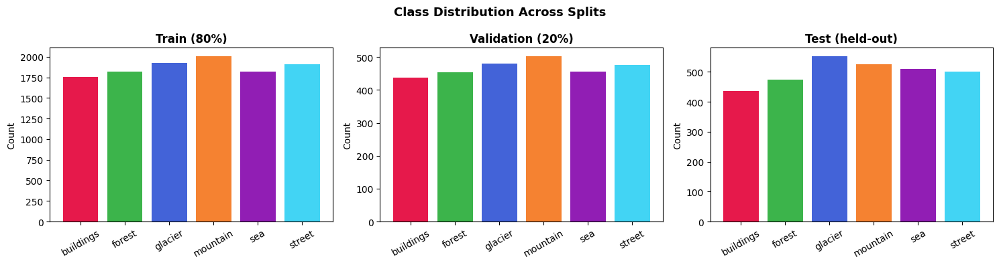

In [ ]:
# Build file-path lists for ALL images in seg_train, then split 80/20.
# We do this once here and reuse throughout the notebook.

all_paths, all_labels = [], []
for cls in CLASS_NAMES:
    cls_dir = os.path.join(TRAIN_DIR, cls)
    if not os.path.isdir(cls_dir): continue
    for fname in os.listdir(cls_dir):
        if fname.lower().endswith(('.jpg','.jpeg','.png')):
            all_paths.append(os.path.join(cls_dir, fname))
            all_labels.append(CLASS_MAP[cls])

all_paths  = np.array(all_paths)
all_labels = np.array(all_labels)

# Stratified 80/20 split - keeps class proportions equal in both halves
train_paths, val_paths, train_labels, val_labels = train_test_split(
    all_paths, all_labels,
    test_size=0.20, random_state=SEED, stratify=all_labels
)

# Also collect test paths (never used until final evaluation)
test_paths, test_labels = [], []
for cls in CLASS_NAMES:
    cls_dir = os.path.join(TEST_DIR, cls)
    if not os.path.isdir(cls_dir): continue
    for fname in os.listdir(cls_dir):
        if fname.lower().endswith(('.jpg','.jpeg','.png')):
            test_paths.append(os.path.join(cls_dir, fname))
            test_labels.append(CLASS_MAP[cls])
test_paths  = np.array(test_paths)
test_labels = np.array(test_labels)

print(f'Total seg_train images : {len(all_paths)}')
print(f'  → Train split        : {len(train_paths)} ({len(train_paths)/len(all_paths)*100:.0f}%)')
print(f'  → Val   split        : {len(val_paths)}  ({len(val_paths)/len(all_paths)*100:.0f}%)')
print(f'Held-out seg_test      : {len(test_paths)} (untouched until final eval)')

# Verify class balance
fig, axes = plt.subplots(1, 3, figsize=(15,4))
for ax, labels, title in zip(axes,
                              [train_labels, val_labels, test_labels],
                              ['Train (80%)', 'Validation (20%)', 'Test (held-out)']):
    counts = [np.sum(labels==i) for i in range(N_CLASSES)]
    ax.bar(CLASS_NAMES, counts, color=COLORS)
    ax.set_title(title, fontweight='bold')
    ax.set_xticklabels(CLASS_NAMES, rotation=30)
    ax.set_ylabel('Count')
plt.suptitle('Class Distribution Across Splits', fontsize=13, fontweight='bold')
plt.tight_layout(); plt.show()

##Step 5: Exploratory Data Analysis

Before touching any model, it is worth just *looking* at the data. We want to check:
1. Are the images what we expect - correct size, correct colours?
2. Is there any obvious noise (corrupted images, wrong labels)?
3. Are the classes visually distinct, or are some likely to be confused?

 `mountain` and `glacier` are visually similar (both have snow, rocks, and sky), and `buildings` and `street` both contain urban textures. We will come back to these observations when interpreting our confusion matrices later.

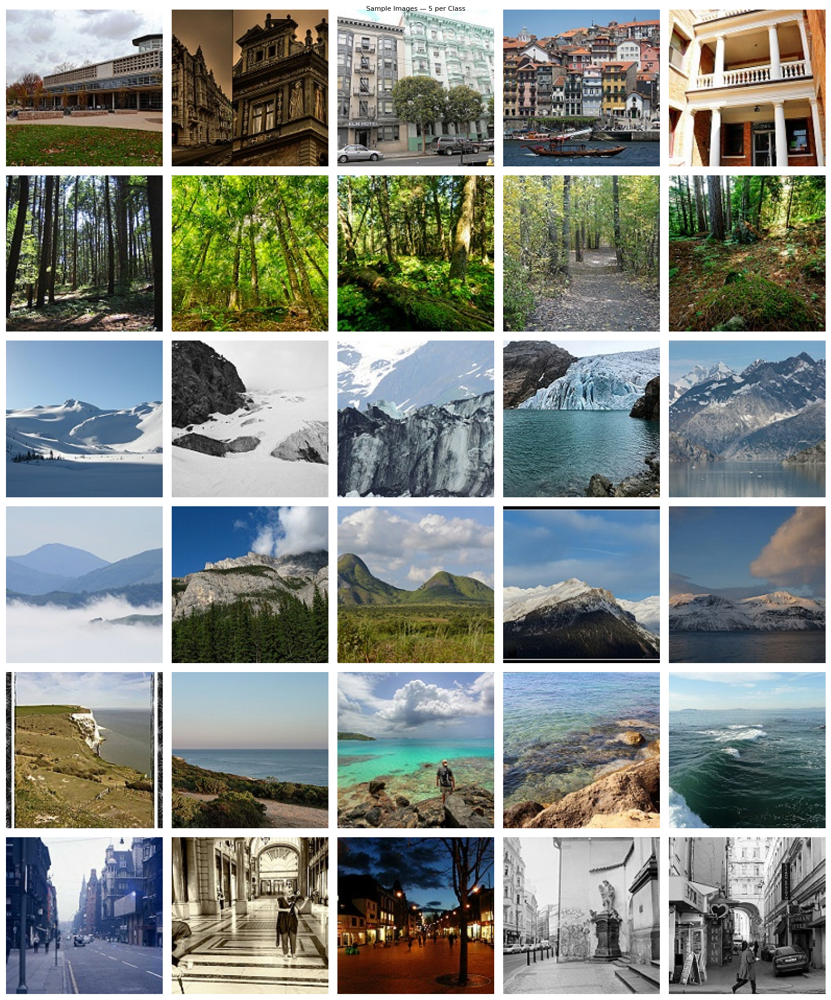

In [ ]:
fig, axes = plt.subplots(6, 5, figsize=(14, 17))
fig.suptitle('Sample Images — 5 per Class', fontsize=8, )

for row, cls in enumerate(CLASS_NAMES):
    cls_dir = os.path.join(TRAIN_DIR, cls)
    sample_files = os.listdir(cls_dir)[:5]
    for col, fname in enumerate(sample_files):
        img = cv2.imread(os.path.join(cls_dir, fname))
        img = cv2.cvtColor(cv2.resize(img, (150,150)), cv2.COLOR_BGR2RGB)
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
        if col == 0:
            axes[row, col].set_ylabel(cls, fontsize=11, fontweight='bold',
                                      rotation=0, labelpad=60, va='center')
plt.tight_layout()
plt.show()


# Random Forest - 7 Experiments

## Why Random Forest at all?

Random Forest is the strongest general-purpose traditional ML classifier. It handles high-dimensional data, is resistant to overfitting through bagging, and requires almost no preprocessing. But it has one fundamental weakness for images: **it has no concept of spatial structure**. It treats every feature as an independent number - pixel (0,0) and pixel (0,1) are no more related to each other than they are to pixel (149,149).

## Why NOT raw pixel flattening?

The naive approach is to flatten each image into a 1D vector of pixel values. For a 64×64×3 image that is 12,288 features. The problem is not the dimensionality, PCA can handle that. The problem is that **raw pixels carry almost no semantic meaning for RF**. A forest image and a mountain image might have very similar pixel intensity distributions if one is bright and the other is dark. What makes an image a 'forest' is the *spatial arrangement* of those pixels, the texture of leaves, the repeating patterns of branches.

## The better approach: HOG + Colour Histograms

**HOG (Histogram of Oriented Gradients)** is a classical computer vision feature that captures edge directions and their spatial arrangement across local image patches. It is explicitly designed to encode shape and texture, exactly what differentiates our six classes. A forest has chaotic, multi-directional edge patterns (branches, leaves). A sea has mostly horizontal gradients. A glacier has smooth gradients with occasional sharp rock edges.

**Colour histograms** capture the distribution of hue, saturation, and value per region. A forest is predominantly green. A sea is blue. A glacier is white/grey. Combined with HOG, this gives RF a fighting chance at spatial discrimination.

This is proper **feature engineering**, we are encoding domain knowledge about what makes images visually distinct into features that RF can actually use.

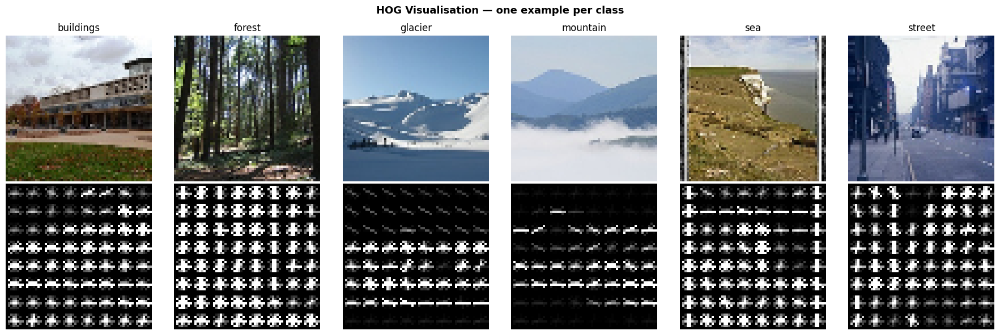

HOG captures edges and gradients — you can see the structural differences between classes.


In [ ]:
# FEATURE EXTRACTION PIPELINE FOR RANDOM FOREST
# We extract HOG + colour histogram features from each image.
# This replaces raw pixel flattening and gives RF spatial context.

def extract_hog_features(img_bgr, img_size=64):
    """Extract HOG features from a single BGR image."""
    img = cv2.resize(img_bgr, (img_size, img_size))
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    features = hog(
        img_gray,
        orientations=9,          # 9 gradient orientation bins
        pixels_per_cell=(8,8),   # local cell size
        cells_per_block=(2,2),   # normalisation block size
        visualize=False,
        feature_vector=True
    )
    return features


def extract_colour_histogram(img_bgr, img_size=64, bins=32):
    """Extract HSV colour histogram — 3 channels × bins values."""
    img = cv2.resize(img_bgr, (img_size, img_size))
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    hist_features = []
    for ch in range(3):
        hist = cv2.calcHist([img_hsv],[ch],None,[bins],[0,256])
        hist = cv2.normalize(hist, hist).flatten()
        hist_features.extend(hist)
    return np.array(hist_features)


def extract_combined_features(img_bgr, img_size=64):
    """Concatenate HOG + colour histogram into one feature vector."""
    hog_f   = extract_hog_features(img_bgr, img_size)
    color_f = extract_colour_histogram(img_bgr, img_size)
    return np.concatenate([hog_f, color_f])


def load_features_from_paths(paths, labels, img_size=64, feature_fn=extract_combined_features):
    """Load images from file paths and extract features."""
    X, y = [], []
    for p, lbl in zip(paths, labels):
        img = cv2.imread(p)
        if img is None: continue
        X.append(feature_fn(img, img_size))
        y.append(lbl)
    return np.array(X, dtype=np.float32), np.array(y)


# Visualise HOG on one example per class
from skimage.feature import hog as skimage_hog
from skimage import exposure

fig, axes = plt.subplots(2, 6, figsize=(18,6))
fig.suptitle('HOG Visualisation — one example per class', fontsize=13, fontweight='bold')
for col, cls in enumerate(CLASS_NAMES):
    cls_dir = os.path.join(TRAIN_DIR, cls)
    img_path = os.path.join(cls_dir, os.listdir(cls_dir)[0])
    img = cv2.imread(img_path)
    img_rgb  = cv2.cvtColor(cv2.resize(img,(64,64)), cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(cv2.resize(img,(64,64)), cv2.COLOR_BGR2GRAY)
    _, hog_img = skimage_hog(img_gray, orientations=9, pixels_per_cell=(8,8),
                              cells_per_block=(2,2), visualize=True)
    hog_img = exposure.rescale_intensity(hog_img, in_range=(0, 10))
    axes[0,col].imshow(img_rgb);      axes[0,col].axis('off'); axes[0,col].set_title(cls)
    axes[1,col].imshow(hog_img, cmap='gray'); axes[1,col].axis('off')
axes[0,0].set_ylabel('Original', fontweight='bold')
axes[1,0].set_ylabel('HOG', fontweight='bold')
plt.tight_layout(); plt.show()
print('HOG captures edges and gradients — you can see the structural differences between classes.')

In [ ]:
#  Extract features for all three splits
# This takes a few minutes. We do it once and reuse across all RF experiments.
print('Extracting HOG + colour features...')
print('  Training set...')
X_train_rf, y_train_rf = load_features_from_paths(train_paths, train_labels)
print('  Validation set...')
X_val_rf,   y_val_rf   = load_features_from_paths(val_paths,   val_labels)
print('  Test set (held-out)...')
X_test_rf,  y_test_rf  = load_features_from_paths(test_paths,  test_labels)

print(f'\nFeature vector size : {X_train_rf.shape[1]} dims (HOG + colour histogram)')
print(f'X_train : {X_train_rf.shape}')
print(f'X_val   : {X_val_rf.shape}')
print(f'X_test  : {X_test_rf.shape}')
print('Feature extraction complete')

Extracting HOG + colour features...
  Training set...
  Validation set...
  Test set (held-out)...

Feature vector size : 1860 dims (HOG + colour histogram)
X_train : (11227, 1860)
X_val   : (2807, 1860)
X_test  : (3000, 1860)
Feature extraction complete



### RF Experiment 1 - Baseline (100 trees, HOG + colour features)

This is my baseline Random Forest. I use 100 trees with default scikit-learn settings. The point of this experiment is to establish a floor, the minimum I can expect from RF with decent features.I evaluate on the **held-out test set**, val accuracy is tracked separately for diagnostic purposes.

Validation accuracy : 69.65%  (for diagnostic use only)


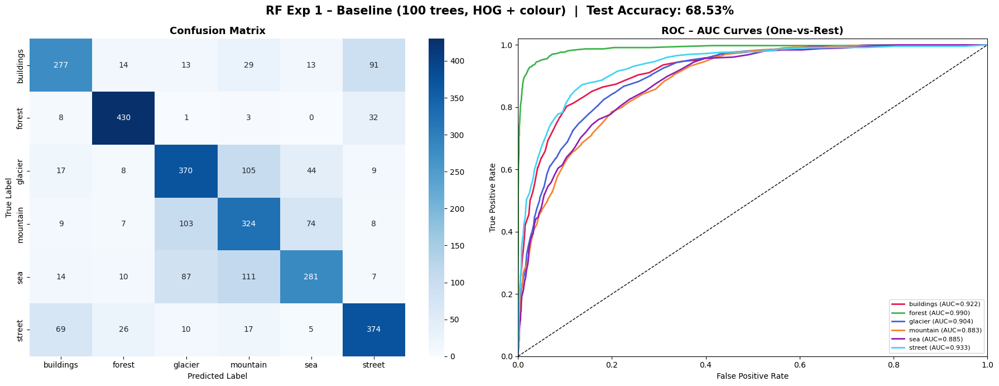

              precision    recall  f1-score   support

   buildings       0.70      0.63      0.67       437
      forest       0.87      0.91      0.89       474
     glacier       0.63      0.67      0.65       553
    mountain       0.55      0.62      0.58       525
         sea       0.67      0.55      0.61       510
      street       0.72      0.75      0.73       501

    accuracy                           0.69      3000
   macro avg       0.69      0.69      0.69      3000
weighted avg       0.69      0.69      0.68      3000

  Mean ROC-AUC : 0.9192
  Notes        : n_estimators=100, HOG+colour features, default params


(0.6853333333333333, np.float64(0.9192028202397964))

In [ ]:
EXP_NAME = 'RF Exp 1 – Baseline (100 trees, HOG + colour)'
t0 = time.time()

rf1 = RandomForestClassifier(n_estimators=100, random_state=SEED, n_jobs=-1)
rf1.fit(X_train_rf, y_train_rf)

train_time = time.time() - t0
val_acc  = accuracy_score(y_val_rf, rf1.predict(X_val_rf))
y_pred   = rf1.predict(X_test_rf)
y_score  = rf1.predict_proba(X_test_rf)
print(f'Validation accuracy : {val_acc*100:.2f}%  (for diagnostic use only)')

show_experiment_results(EXP_NAME, 'Random Forest', y_test_rf, y_pred, y_score,
                        extra_info='n_estimators=100, HOG+colour features, default params',
                        train_time=train_time)


### RF Experiment 2 - More Trees (300 trees)

Random Forests generally improve with more trees up to a point of diminishing returns. The variance of the ensemble decreases as we add more trees (each tree sees a random bootstrap sample, so more trees = more coverage of the data). The question is whether going from 100 to 300 trees gives a meaningful accuracy boost, or whether we have already extracted most of the signal from our HOG features. Training time will increase roughly linearly, so this is a classic bias-variance vs compute trade-off.

Validation accuracy : 71.75%


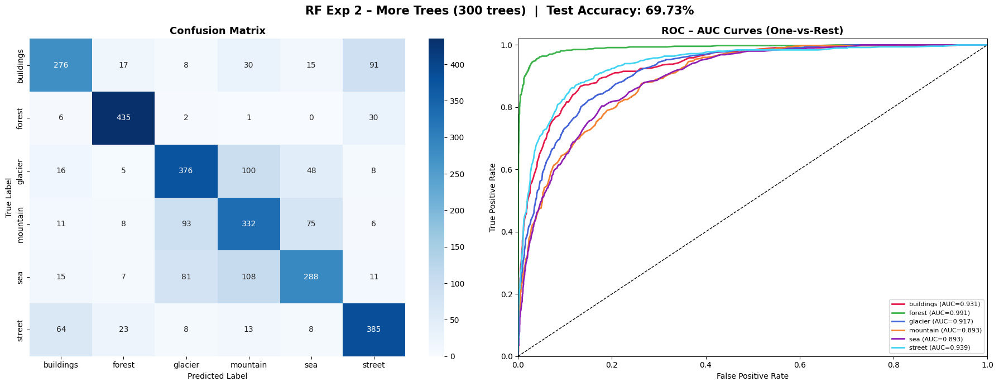

              precision    recall  f1-score   support

   buildings       0.71      0.63      0.67       437
      forest       0.88      0.92      0.90       474
     glacier       0.66      0.68      0.67       553
    mountain       0.57      0.63      0.60       525
         sea       0.66      0.56      0.61       510
      street       0.73      0.77      0.75       501

    accuracy                           0.70      3000
   macro avg       0.70      0.70      0.70      3000
weighted avg       0.70      0.70      0.70      3000

  Mean ROC-AUC : 0.9272
  Notes        : n_estimators=300 — tests diminishing returns beyond 100 trees


(0.6973333333333334, np.float64(0.9271547377033272))

In [ ]:
EXP_NAME = 'RF Exp 2 – More Trees (300 trees)'
t0 = time.time()

rf2 = RandomForestClassifier(n_estimators=300, random_state=SEED, n_jobs=-1)
rf2.fit(X_train_rf, y_train_rf)

train_time = time.time() - t0
val_acc = accuracy_score(y_val_rf, rf2.predict(X_val_rf))
y_pred  = rf2.predict(X_test_rf)
y_score = rf2.predict_proba(X_test_rf)
print(f'Validation accuracy : {val_acc*100:.2f}%')

show_experiment_results(EXP_NAME, 'Random Forest', y_test_rf, y_pred, y_score,
                        extra_info='n_estimators=300 — tests diminishing returns beyond 100 trees',
                        train_time=train_time)

### RF Experiment 3 - Depth Limiting (max_depth=15)

By default, RF trees grow until all leaves are pure - this leads to very deep trees that memorise training data. Limiting `max_depth` is a form of regularisation that trades a little bias for a significant reduction in variance. The hypothesis is that our HOG features are noisy enough that very deep trees are overfitting to specific feature combinations that do not generalise. If test accuracy *improves* with shallower trees, that confirms overfitting in Exp 1 and 2.

Validation accuracy : 70.89%


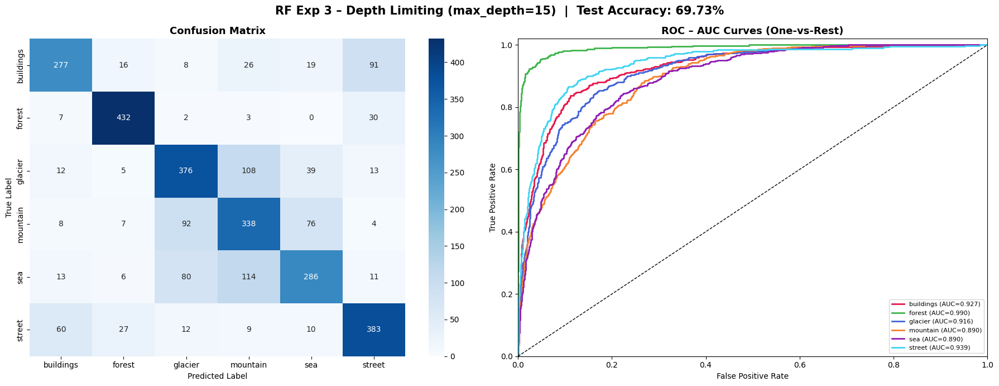

              precision    recall  f1-score   support

   buildings       0.73      0.63      0.68       437
      forest       0.88      0.91      0.89       474
     glacier       0.66      0.68      0.67       553
    mountain       0.57      0.64      0.60       525
         sea       0.67      0.56      0.61       510
      street       0.72      0.76      0.74       501

    accuracy                           0.70      3000
   macro avg       0.70      0.70      0.70      3000
weighted avg       0.70      0.70      0.70      3000

  Mean ROC-AUC : 0.9254
  Notes        : max_depth=15 regularises trees — reduces overfitting


(0.6973333333333334, np.float64(0.9253760594828474))

In [ ]:
EXP_NAME = 'RF Exp 3 – Depth Limiting (max_depth=15)'
t0 = time.time()

rf3 = RandomForestClassifier(n_estimators=200, max_depth=15,
                              random_state=SEED, n_jobs=-1)
rf3.fit(X_train_rf, y_train_rf)

train_time = time.time() - t0
val_acc = accuracy_score(y_val_rf, rf3.predict(X_val_rf))
y_pred  = rf3.predict(X_test_rf)
y_score = rf3.predict_proba(X_test_rf)
print(f'Validation accuracy : {val_acc*100:.2f}%')

show_experiment_results(EXP_NAME, 'Random Forest', y_test_rf, y_pred, y_score,
                        extra_info='max_depth=15 regularises trees — reduces overfitting',
                        train_time=train_time)

###  RF Experiment 4 - PCA Dimensionality Reduction + RF

Even with HOG, our feature vector still has several hundred dimensions. Many of these dimensions are correlated - adjacent HOG cells capture similar gradient patterns. PCA decorrelates the features and projects them onto the directions of maximum variance. This can:
1. Remove redundant / noisy dimensions that confuse RF
2. Speed up training significantly
3. Potentially improve generalisation by removing noise dimensions

We fit PCA on the training set only and then transform val/test - never the reverse. This prevents data leakage.

Variance explained by 150 PCs: 66.9%
Validation accuracy : 69.72%


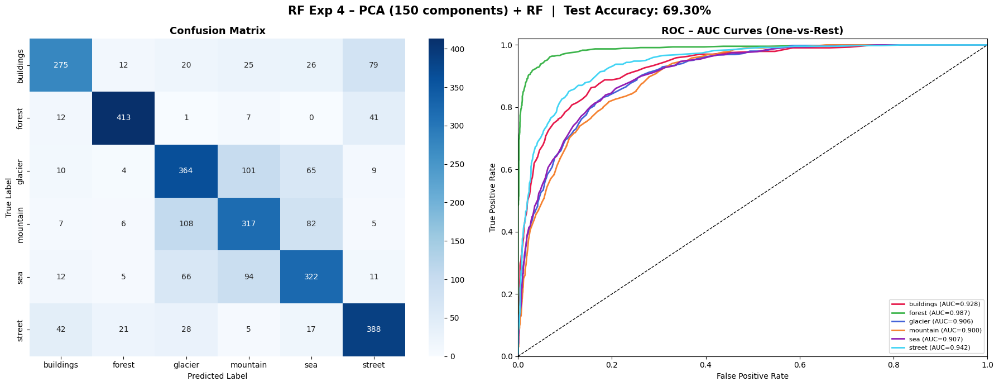

              precision    recall  f1-score   support

   buildings       0.77      0.63      0.69       437
      forest       0.90      0.87      0.88       474
     glacier       0.62      0.66      0.64       553
    mountain       0.58      0.60      0.59       525
         sea       0.63      0.63      0.63       510
      street       0.73      0.77      0.75       501

    accuracy                           0.69      3000
   macro avg       0.70      0.69      0.70      3000
weighted avg       0.70      0.69      0.69      3000

  Mean ROC-AUC : 0.9284
  Notes        : PCA(150) fitted on train only — no leakage


(0.693, np.float64(0.9283969287053123))

In [ ]:
EXP_NAME = 'RF Exp 4 – PCA (150 components) + RF'
t0 = time.time()

pca4 = PCA(n_components=150, random_state=SEED)
X_train_pca4 = pca4.fit_transform(X_train_rf)   # fit on train only!
X_val_pca4   = pca4.transform(X_val_rf)
X_test_pca4  = pca4.transform(X_test_rf)
print(f'Variance explained by 150 PCs: {pca4.explained_variance_ratio_.sum()*100:.1f}%')

rf4 = RandomForestClassifier(n_estimators=200, random_state=SEED, n_jobs=-1)
rf4.fit(X_train_pca4, y_train_rf)

train_time = time.time() - t0
val_acc = accuracy_score(y_val_rf, rf4.predict(X_val_pca4))
y_pred  = rf4.predict(X_test_pca4)
y_score = rf4.predict_proba(X_test_pca4)
print(f'Validation accuracy : {val_acc*100:.2f}%')

show_experiment_results(EXP_NAME, 'Random Forest', y_test_rf, y_pred, y_score,
                        extra_info='PCA(150) fitted on train only — no leakage',
                        train_time=train_time)

###  RF Experiment 5 - StandardScaler + RF

Random Forest is generally scale-invariant - it makes splits based on rank order, not absolute values. However, when combined with other techniques (or when features have wildly different ranges as HOG and colour histograms do), standardisation can help RF explore the feature space more evenly. This experiment tests whether scaling changes anything. If it does not, that confirms RF's theoretical scale-invariance. If it does, it suggests the feature ranges were creating imbalanced split behaviour.

Validation accuracy : 71.00%


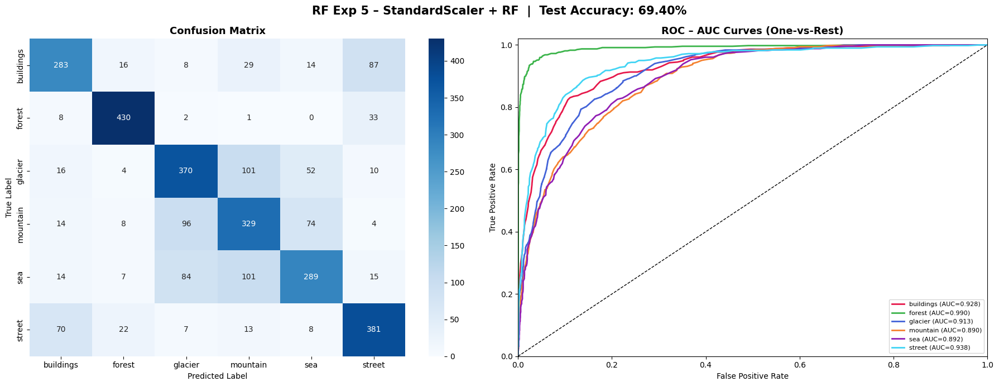

              precision    recall  f1-score   support

   buildings       0.70      0.65      0.67       437
      forest       0.88      0.91      0.89       474
     glacier       0.65      0.67      0.66       553
    mountain       0.57      0.63      0.60       525
         sea       0.66      0.57      0.61       510
      street       0.72      0.76      0.74       501

    accuracy                           0.69      3000
   macro avg       0.70      0.70      0.70      3000
weighted avg       0.69      0.69      0.69      3000

  Mean ROC-AUC : 0.9253
  Notes        : Scaler fitted on train only — tests scale-invariance assumption


(0.694, np.float64(0.9252537574424977))

In [ ]:
EXP_NAME = 'RF Exp 5 – StandardScaler + RF'
t0 = time.time()

scaler = StandardScaler()
X_train_sc = scaler.fit_transform(X_train_rf)   # fit on train only!
X_val_sc   = scaler.transform(X_val_rf)
X_test_sc  = scaler.transform(X_test_rf)

rf5 = RandomForestClassifier(n_estimators=200, random_state=SEED, n_jobs=-1)
rf5.fit(X_train_sc, y_train_rf)

train_time = time.time() - t0
val_acc = accuracy_score(y_val_rf, rf5.predict(X_val_sc))
y_pred  = rf5.predict(X_test_sc)
y_score = rf5.predict_proba(X_test_sc)
print(f'Validation accuracy : {val_acc*100:.2f}%')

show_experiment_results(EXP_NAME, 'Random Forest', y_test_rf, y_pred, y_score,
                        extra_info='Scaler fitted on train only — tests scale-invariance assumption',
                        train_time=train_time)

### RF Experiment 6 - Balanced Class Weights

Even though the Intel dataset is roughly balanced, some classes have slightly more samples than others. `class_weight='balanced'` tells RF to upweight the loss from minority classes proportionally. This is standard practice for any real-world classification task and tends to improve per-class recall for underrepresented classes - which shows up clearly in the confusion matrix and per-class AUC. We also switch to `max_features='sqrt'` (the theoretically optimal setting for classification with RF).

Validation accuracy : 70.72%


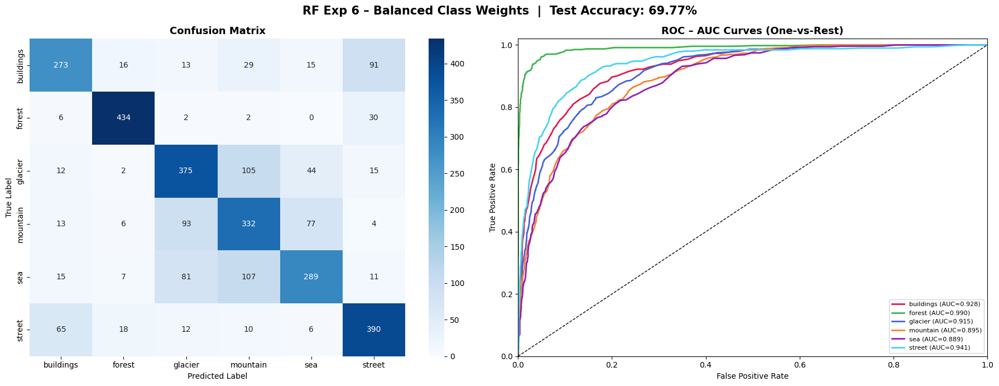

              precision    recall  f1-score   support

   buildings       0.71      0.62      0.67       437
      forest       0.90      0.92      0.91       474
     glacier       0.65      0.68      0.66       553
    mountain       0.57      0.63      0.60       525
         sea       0.67      0.57      0.61       510
      street       0.72      0.78      0.75       501

    accuracy                           0.70      3000
   macro avg       0.70      0.70      0.70      3000
weighted avg       0.70      0.70      0.70      3000

  Mean ROC-AUC : 0.9263
  Notes        : class_weight=balanced, max_features=sqrt


(0.6976666666666667, np.float64(0.9263257675633597))

In [ ]:
EXP_NAME = 'RF Exp 6 – Balanced Class Weights'
t0 = time.time()

rf6 = RandomForestClassifier(n_estimators=200, class_weight='balanced',
                              max_features='sqrt', random_state=SEED, n_jobs=-1)
rf6.fit(X_train_rf, y_train_rf)

train_time = time.time() - t0
val_acc = accuracy_score(y_val_rf, rf6.predict(X_val_rf))
y_pred  = rf6.predict(X_test_rf)
y_score = rf6.predict_proba(X_test_rf)
print(f'Validation accuracy : {val_acc*100:.2f}%')

show_experiment_results(EXP_NAME, 'Random Forest', y_test_rf, y_pred, y_score,
                        extra_info='class_weight=balanced, max_features=sqrt',
                        train_time=train_time)

###  RF Experiment 7  Best of Everything (PCA + Depth Control + Balanced)

This is the kitchen-sink experiment  we combine the best ideas from Experiments 3, 4, and 6: PCA to remove redundant dimensions, `max_depth` to prevent overfitting, balanced class weights for fair per-class learning, and careful leaf/split controls. The expectation is that this should be the best-performing RF configuration, but we will let the numbers confirm or deny that. If it is not better, it tells us that the individual improvements were not additive  a common finding in traditional ML.

Validation accuracy : 70.50%


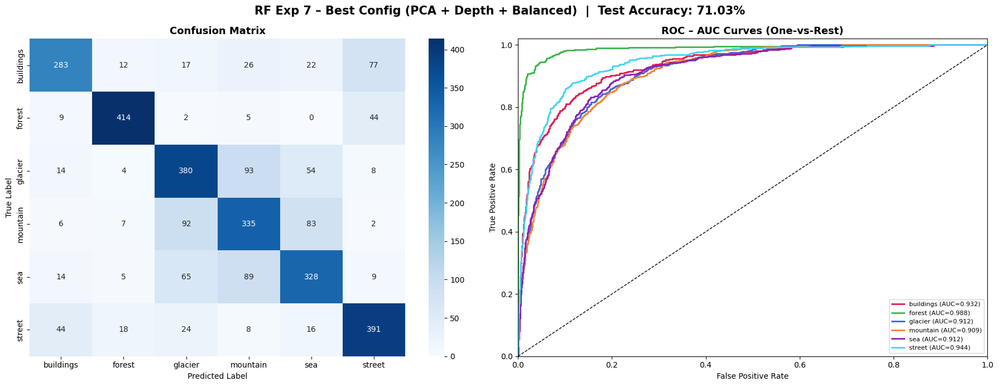

              precision    recall  f1-score   support

   buildings       0.76      0.65      0.70       437
      forest       0.90      0.87      0.89       474
     glacier       0.66      0.69      0.67       553
    mountain       0.60      0.64      0.62       525
         sea       0.65      0.64      0.65       510
      street       0.74      0.78      0.76       501

    accuracy                           0.71      3000
   macro avg       0.72      0.71      0.71      3000
weighted avg       0.71      0.71      0.71      3000

  Mean ROC-AUC : 0.9328
  Notes        : PCA(120)+max_depth=20+balanced weights+min_samples tuning


(0.7103333333333334, np.float64(0.9328382266970722))

In [ ]:
EXP_NAME = 'RF Exp 7 – Best Config (PCA + Depth + Balanced)'
t0 = time.time()

pca7 = PCA(n_components=120, random_state=SEED)
X_train_pca7 = pca7.fit_transform(X_train_rf)
X_val_pca7   = pca7.transform(X_val_rf)
X_test_pca7  = pca7.transform(X_test_rf)

rf7 = RandomForestClassifier(
    n_estimators=300, max_depth=20,
    min_samples_leaf=2, min_samples_split=5,
    class_weight='balanced', max_features='sqrt',
    random_state=SEED, n_jobs=-1
)
rf7.fit(X_train_pca7, y_train_rf)

train_time = time.time() - t0
val_acc = accuracy_score(y_val_rf, rf7.predict(X_val_pca7))
y_pred  = rf7.predict(X_test_pca7)
y_score = rf7.predict_proba(X_test_pca7)
print(f'Validation accuracy : {val_acc*100:.2f}%')

show_experiment_results(EXP_NAME, 'Random Forest', y_test_rf, y_pred, y_score,
                        extra_info='PCA(120)+max_depth=20+balanced weights+min_samples tuning',
                        train_time=train_time)

# PART 2: CNN - 7 Experiments

## Why CNN beats Random Forest on images

The fundamental difference between RF and CNN is that **convolutional layers explicitly model spatial relationships**. A 3×3 kernel slides across the image and learns to detect local patterns - edges, corners, textures - in a way that is translation-invariant. Stacking multiple conv layers means the network learns a hierarchy: early layers detect edges, middle layers detect shapes, deep layers detect semantic concepts like 'tree canopy' or 'building facade'.

This is exactly what is needed for scene classification. HOG was our best attempt to hand-engineer spatial features for RF. CNN learns better spatial features automatically from data.

## Data augmentation strategy

We use `ImageDataGenerator` with horizontal/vertical flips, zoom, and shift. We deliberately avoid rotation beyond what is natural for these scenes - a photo of a mountain is never upside down, so aggressive rotation would introduce unrealistic samples. Augmentation is applied **only to the training generator**, never to validation or test.

## Train / Val / Test for CNNs

We use `ImageDataGenerator` with a **validation split of 0.20** drawn from `seg_train`. The `seg_test` directory is loaded separately as a final evaluation set and never passed to `model.fit()`.

In [ ]:
# CNN GENERATOR HELPERS
# We write temporary directory manifests so ImageDataGenerator can use
# our pre-computed 80/20 file-path split cleanly.

import shutil, tempfile

def build_split_dirs(paths, labels, base_dir):
    """Create a directory structure that ImageDataGenerator can read.
    Uses symlinks to avoid copying 14k images."""
    if os.path.exists(base_dir):
        shutil.rmtree(base_dir)
    for cls in CLASS_NAMES:
        os.makedirs(os.path.join(base_dir, cls), exist_ok=True)
    for p, lbl in zip(paths, labels):
        dst = os.path.join(base_dir, CLASS_NAMES[lbl], os.path.basename(p))
        if not os.path.exists(dst):
            os.symlink(p, dst)


print('Building split directory structures (symlinks — no copying)...')
TRAIN_SPLIT_DIR = '/tmp/intel_train'
VAL_SPLIT_DIR   = '/tmp/intel_val'
TEST_SPLIT_DIR  = '/tmp/intel_test'

build_split_dirs(train_paths, train_labels, TRAIN_SPLIT_DIR)
build_split_dirs(val_paths,   val_labels,   VAL_SPLIT_DIR)
build_split_dirs(test_paths,  test_labels,  TEST_SPLIT_DIR)

print(f'Train dir : {TRAIN_SPLIT_DIR}  ({len(train_paths)} images)')
print(f'Val   dir : {VAL_SPLIT_DIR}   ({len(val_paths)} images)')
print(f'Test  dir : {TEST_SPLIT_DIR}   ({len(test_paths)} images)')
print(' Split directories ready')

Building split directory structures (symlinks — no copying)...
Train dir : /tmp/intel_train  (11227 images)
Val   dir : /tmp/intel_val   (2807 images)
Test  dir : /tmp/intel_test   (3000 images)
 Split directories ready


In [ ]:
#  Reusable generator factory
def make_generators(batch_size=32, augment=False, target_size=(150,150)):
    """Returns (train_gen, val_gen, test_gen) from our 80/20 split dirs."""
    aug_args = dict(rescale=1./255)
    if augment:
        aug_args.update(dict(
            width_shift_range=0.2,
            height_shift_range=0.2,
            zoom_range=0.2,
            horizontal_flip=True,
            vertical_flip=False,   # scenes are not upside-down
            fill_mode='nearest'
        ))
    train_gen = ImageDataGenerator(**aug_args).flow_from_directory(
        TRAIN_SPLIT_DIR, batch_size=batch_size,
        class_mode='categorical', target_size=target_size, seed=SEED
    )
    val_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
        VAL_SPLIT_DIR, batch_size=batch_size,
        class_mode='categorical', target_size=target_size, shuffle=False
    )
    test_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
        TEST_SPLIT_DIR, batch_size=batch_size,
        class_mode='categorical', target_size=target_size, shuffle=False
    )
    return train_gen, val_gen, test_gen


def eval_keras_model(model, test_gen):
    """Run inference on test_gen, return (y_true, y_pred, y_score)."""
    test_gen.reset()
    y_score = model.predict(test_gen, verbose=0)
    y_pred  = np.argmax(y_score, axis=1)
    y_true  = test_gen.classes
    return y_true, y_pred, y_score


COMMON_CALLBACKS = [
    ReduceLROnPlateau(monitor='val_accuracy', patience=2,
                      factor=0.25, min_lr=1e-6, verbose=1),
    EarlyStopping(monitor='val_accuracy', patience=5,
                  restore_best_weights=True, verbose=1)
]

print('CNN helpers ready')

CNN helpers ready


### CNN Experiment 1 - Baseline (3 Conv Blocks, no regularisation)

This is the simplest possible CNN - three conv-pool blocks followed by a dense head. No dropout, no batch normalisation, no augmentation. The purpose is to establish the floor for deep learning on this task. We expect it to beat Random Forest convincingly, but we also expect it to overfit because there is nothing stopping it from memorising the training data. The training curve should show the training accuracy converging near 100% while validation accuracy plateaus much lower - a textbook overfitting signature.

Found 11227 images belonging to 6 classes.
Found 2807 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


I0000 00:00:1771519612.022877      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1771519612.029324      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "cnn_baseline"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36992)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    18,940,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │         3,078 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,036,742 (72.62 MB)

 Trainable params: 19,036,742 (72.62 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/15


I0000 00:00:1771519615.129880     374 service.cc:152] XLA service 0x7cd9f0006c30 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1771519615.129918     374 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1771519615.129921     374 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1771519615.504541     374 cuda_dnn.cc:529] Loaded cuDNN version 91002


  5/351 ━━━━━━━━━━━━━━━━━━━━ 14s 41ms/step - accuracy: 0.2637 - loss: 1.9326

I0000 00:00:1771519619.093391     374 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


351/351 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step - accuracy: 0.5660 - loss: 1.1022 - val_accuracy: 0.7346 - val_loss: 0.7162 - learning_rate: 0.0010
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step - accuracy: 0.7670 - loss: 0.6269 - val_accuracy: 0.7574 - val_loss: 0.6345 - learning_rate: 0.0010
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 18s 51ms/step - accuracy: 0.8306 - loss: 0.4537 - val_accuracy: 0.8033 - val_loss: 0.5360 - learning_rate: 0.0010
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step - accuracy: 0.8930 - loss: 0.2930 - val_accuracy: 0.7980 - val_loss: 0.5760 - learning_rate: 0.0010
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.9441 - loss: 0.1751
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
351/351 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step - accuracy: 0.9441 - loss: 0.1751 - val_accuracy: 0.7998 - val_loss: 0.6879 - learning_rate: 0.0010
Epoch 6/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 18s 50ms/step - accuracy: 0.9826 - loss: 0.0667 -

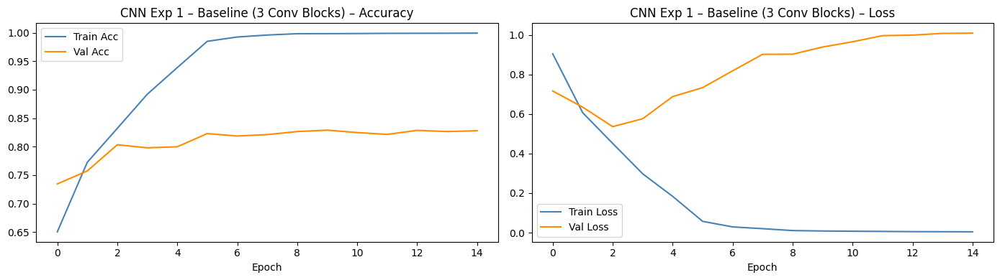

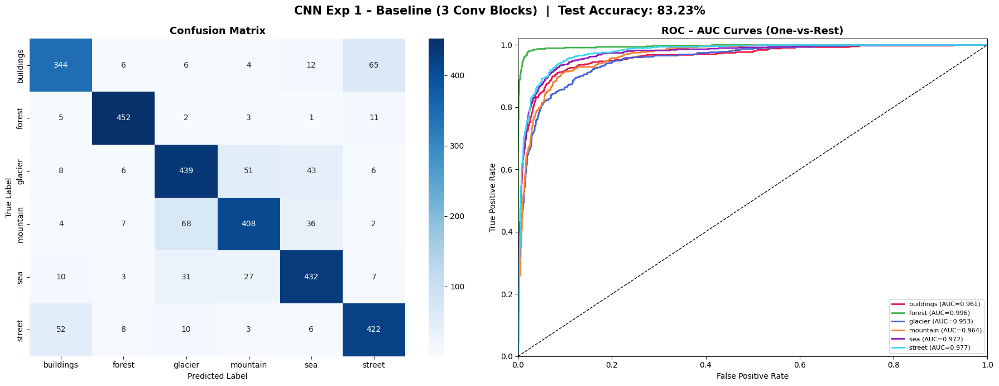

              precision    recall  f1-score   support

   buildings       0.81      0.79      0.80       437
      forest       0.94      0.95      0.95       474
     glacier       0.79      0.79      0.79       553
    mountain       0.82      0.78      0.80       525
         sea       0.82      0.85      0.83       510
      street       0.82      0.84      0.83       501

    accuracy                           0.83      3000
   macro avg       0.83      0.83      0.83      3000
weighted avg       0.83      0.83      0.83      3000

  Mean ROC-AUC : 0.9705
  Notes        : Simple 3-block CNN, no dropout, no augmentation


(0.8323333333333334, np.float64(0.9705394403383266))

In [ ]:
EXP_NAME = 'CNN Exp 1 – Baseline (3 Conv Blocks)'
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

train_gen, val_gen, test_gen = make_generators(batch_size=32, augment=False)

model_cnn1 = keras.Sequential([
    layers.Conv2D(32, (3,3), activation='relu', input_shape=(150,150,3)),
    layers.MaxPooling2D(2,2),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D(2,2),
    layers.Conv2D(128,(3,3), activation='relu'),
    layers.MaxPooling2D(2,2),
    layers.Flatten(),
    layers.Dense(512, activation='relu'),
    layers.Dense(N_CLASSES, activation='softmax')
], name='cnn_baseline')

model_cnn1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_cnn1.summary()

t0 = time.time()
history1 = model_cnn1.fit(
    train_gen, epochs=15, validation_data=val_gen,
    callbacks=COMMON_CALLBACKS, verbose=1
)
train_time = time.time() - t0

plot_training_history(history1, EXP_NAME)
y_true, y_pred, y_score = eval_keras_model(model_cnn1, test_gen)
show_experiment_results(EXP_NAME, 'CNN', y_true, y_pred, y_score,
                        extra_info='Simple 3-block CNN, no dropout, no augmentation',
                        train_time=train_time)

###  CNN Experiment 2 - Baseline + Data Augmentation

We keep the exact same architecture as Exp 1 but turn on data augmentation. The hypothesis is that overfitting in Exp 1 was primarily a data problem - the model was seeing the same images over and over and memorising them. Augmentation artificially expands the training distribution by randomly shifting, zooming, and flipping images at each epoch. Each epoch the model sees a *slightly different version* of every image, making memorisation harder. We should see the gap between training and validation curves narrow compared to Exp 1.

Found 11227 images belonging to 6 classes.
Found 2807 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
Epoch 1/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 195ms/step - accuracy: 0.4734 - loss: 1.4114 - val_accuracy: 0.7235 - val_loss: 0.8022 - learning_rate: 0.0010
Epoch 2/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 68s 194ms/step - accuracy: 0.6655 - loss: 0.8797 - val_accuracy: 0.7702 - val_loss: 0.6458 - learning_rate: 0.0010
Epoch 3/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 67s 190ms/step - accuracy: 0.7290 - loss: 0.7146 - val_accuracy: 0.7855 - val_loss: 0.6010 - learning_rate: 0.0010
Epoch 4/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 66s 189ms/step - accuracy: 0.7619 - loss: 0.6538 - val_accuracy: 0.7912 - val_loss: 0.5733 - learning_rate: 0.0010
Epoch 5/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 65s 186ms/step - accuracy: 0.7830 - loss: 0.5936 - val_accuracy: 0.8286 - val_loss: 0.4668 - learning_rate: 0.0010
Epoch 6/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 65s 185ms/step - accuracy: 0.7932 - loss: 0.5628 - val_acc

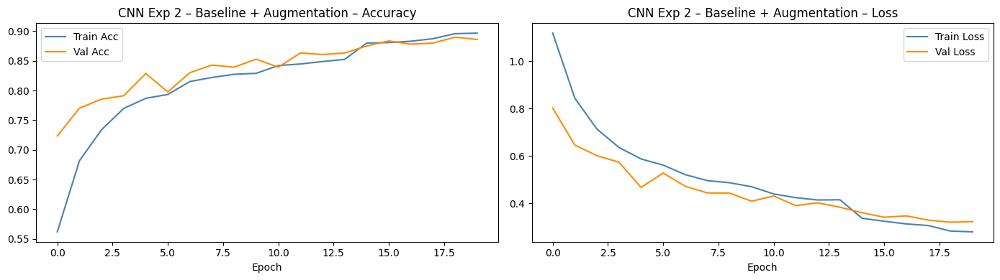

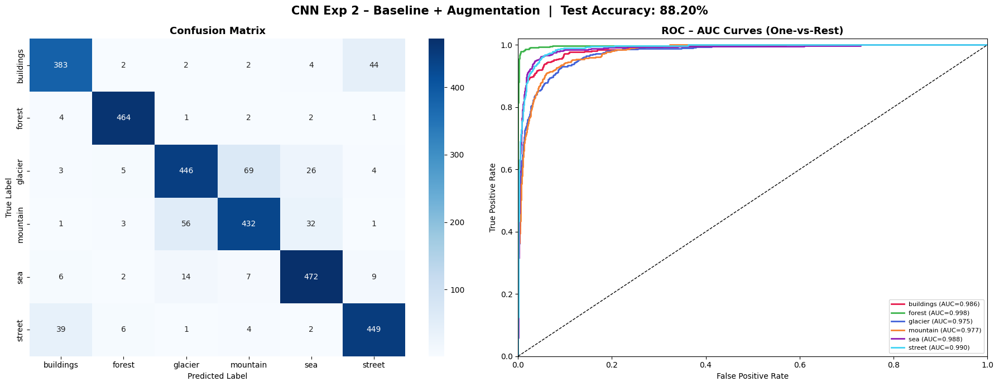

              precision    recall  f1-score   support

   buildings       0.88      0.88      0.88       437
      forest       0.96      0.98      0.97       474
     glacier       0.86      0.81      0.83       553
    mountain       0.84      0.82      0.83       525
         sea       0.88      0.93      0.90       510
      street       0.88      0.90      0.89       501

    accuracy                           0.88      3000
   macro avg       0.88      0.88      0.88      3000
weighted avg       0.88      0.88      0.88      3000

  Mean ROC-AUC : 0.9856
  Notes        : Same arch + shift/zoom/flip augmentation


(0.882, np.float64(0.9856409867483794))

In [ ]:
EXP_NAME = 'CNN Exp 2 – Baseline + Augmentation'
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

train_gen, val_gen, test_gen = make_generators(batch_size=32, augment=True)

model_cnn2 = keras.Sequential([
    layers.Conv2D(32, (3,3), activation='relu', input_shape=(150,150,3)),
    layers.MaxPooling2D(2,2),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D(2,2),
    layers.Conv2D(128,(3,3), activation='relu'),
    layers.MaxPooling2D(2,2),
    layers.Flatten(),
    layers.Dense(512, activation='relu'),
    layers.Dense(N_CLASSES, activation='softmax')
], name='cnn_augmented')

model_cnn2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

t0 = time.time()
history2 = model_cnn2.fit(
    train_gen, epochs=20, validation_data=val_gen,
    callbacks=COMMON_CALLBACKS, verbose=1
)
train_time = time.time() - t0

plot_training_history(history2, EXP_NAME)
y_true, y_pred, y_score = eval_keras_model(model_cnn2, test_gen)
show_experiment_results(EXP_NAME, 'CNN', y_true, y_pred, y_score,
                        extra_info='Same arch + shift/zoom/flip augmentation',
                        train_time=train_time)

### CNN Experiment 3 - Deeper Network + BatchNorm + Dropout

This is where we start building a properly regularised CNN. Two key additions:

**Batch Normalisation** normalises the activations within each mini-batch, which stabilises training, allows higher learning rates, and acts as a mild regulariser. It is placed *after* the conv layer and *before* the activation.

**Dropout** randomly zeroes out a fraction of neurons during training, forcing the network to learn redundant representations. This is the most direct way to reduce co-adaptation between neurons. We use 0.25 after pooling layers and 0.5 before the final dense layer - the higher rate at the end because the dense layer has the most parameters and the most capacity to overfit.

The combination of augmentation + BatchNorm + Dropout should produce the cleanest training curves we have seen so far.

Found 11227 images belonging to 6 classes.
Found 2807 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


Model: "cnn_deep_regularised"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 150, 150, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 150, 150, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 75, 75, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 75, 75, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 37, 37, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 37, 37, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 18, 18, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    21,234,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │         3,078 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,525,158 (82.11 MB)

 Trainable params: 21,524,710 (82.11 MB)

 Non-trainable params: 448 (1.75 KB)

Epoch 1/25


2026-02-19 17:14:11.451878: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 17:14:11.605929: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 17:14:12.216535: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 17:14:12.365036: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 17:14:13.699852: E external/local_xla/xla/stream_

331/351 ━━━━━━━━━━━━━━━━━━━━ 3s 179ms/step - accuracy: 0.3018 - loss: 8.3597

2026-02-19 17:15:22.487585: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 17:15:22.641091: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 17:15:24.021093: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 17:15:24.295220: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


351/351 ━━━━━━━━━━━━━━━━━━━━ 96s 231ms/step - accuracy: 0.3044 - loss: 8.0447 - val_accuracy: 0.3356 - val_loss: 1.5039 - learning_rate: 0.0010
Epoch 2/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 68s 192ms/step - accuracy: 0.4160 - loss: 1.3823 - val_accuracy: 0.5529 - val_loss: 1.1334 - learning_rate: 0.0010
Epoch 3/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 67s 191ms/step - accuracy: 0.4322 - loss: 1.2683 - val_accuracy: 0.6217 - val_loss: 1.0059 - learning_rate: 0.0010
Epoch 4/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 68s 192ms/step - accuracy: 0.5106 - loss: 1.1663 - val_accuracy: 0.5572 - val_loss: 1.2132 - learning_rate: 0.0010
Epoch 5/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 183ms/step - accuracy: 0.5722 - loss: 1.0373
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
351/351 ━━━━━━━━━━━━━━━━━━━━ 68s 194ms/step - accuracy: 0.5722 - loss: 1.0373 - val_accuracy: 0.5729 - val_loss: 1.3106 - learning_rate: 0.0010
Epoch 6/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 68s 195ms/step - accuracy: 0.6324 - loss: 0

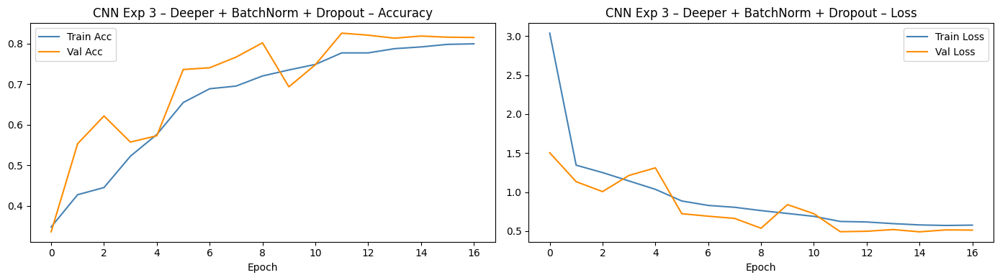

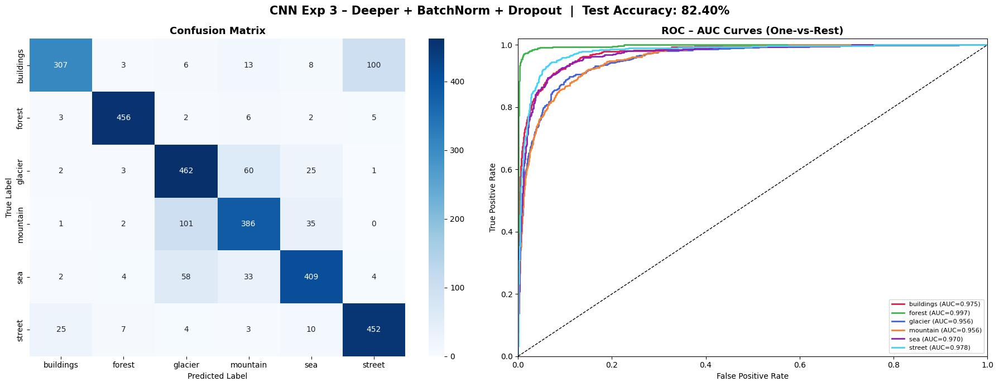

              precision    recall  f1-score   support

   buildings       0.90      0.70      0.79       437
      forest       0.96      0.96      0.96       474
     glacier       0.73      0.84      0.78       553
    mountain       0.77      0.74      0.75       525
         sea       0.84      0.80      0.82       510
      street       0.80      0.90      0.85       501

    accuracy                           0.82      3000
   macro avg       0.83      0.82      0.83      3000
weighted avg       0.83      0.82      0.82      3000

  Mean ROC-AUC : 0.9721
  Notes        : 6 conv layers + BatchNorm + Dropout(0.25/0.5) + augmentation


(0.824, np.float64(0.9720866606986102))

In [ ]:
EXP_NAME = 'CNN Exp 3 – Deeper + BatchNorm + Dropout'
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

train_gen, val_gen, test_gen = make_generators(batch_size=32, augment=True)

model_cnn3 = keras.Sequential([
    layers.Conv2D(32,(3,3), activation='relu', padding='same', input_shape=(150,150,3)),
    layers.BatchNormalization(),
    layers.Conv2D(32,(3,3), activation='relu', padding='same'),
    layers.MaxPooling2D(2,2), layers.Dropout(0.25),

    layers.Conv2D(64,(3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.Conv2D(64,(3,3), activation='relu', padding='same'),
    layers.MaxPooling2D(2,2), layers.Dropout(0.25),

    layers.Conv2D(128,(3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.Conv2D(128,(3,3), activation='relu', padding='same'),
    layers.MaxPooling2D(2,2), layers.Dropout(0.25),

    layers.Flatten(),
    layers.Dense(512, activation='relu'), layers.Dropout(0.5),
    layers.Dense(N_CLASSES, activation='softmax')
], name='cnn_deep_regularised')

model_cnn3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model_cnn3.summary()

t0 = time.time()
history3 = model_cnn3.fit(
    train_gen, epochs=25, validation_data=val_gen,
    callbacks=COMMON_CALLBACKS, verbose=1
)
train_time = time.time() - t0

plot_training_history(history3, EXP_NAME)
y_true, y_pred, y_score = eval_keras_model(model_cnn3, test_gen)
show_experiment_results(EXP_NAME, 'CNN', y_true, y_pred, y_score,
                        extra_info='6 conv layers + BatchNorm + Dropout(0.25/0.5) + augmentation',
                        train_time=train_time)

### CNN Experiment 4 - L2 Regularisation + GlobalAveragePooling

Instead of Dropout, this experiment uses **L2 weight regularisation**, which adds a penalty proportional to the square of each weight to the loss function. This keeps weights small and prevents the model from relying too heavily on any single feature.

We also replace `Flatten()` with **GlobalAveragePooling2D (GAP)**. Instead of unrolling the entire feature map into a long vector, GAP takes the mean of each feature map channel - producing a compact, 128-dimensional vector from the last conv layer. GAP has two advantages: it dramatically reduces parameters (reducing overfitting risk), and it is more spatially robust because it summarises the *entire* feature map rather than the exact spatial arrangement.

We also go 4 conv blocks deep to extract richer features.

Found 11227 images belonging to 6 classes.
Found 2807 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
Epoch 1/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 77s 206ms/step - accuracy: 0.3503 - loss: 1.4920 - val_accuracy: 0.5084 - val_loss: 1.1374 - learning_rate: 0.0010
Epoch 2/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 74s 211ms/step - accuracy: 0.5174 - loss: 1.1120 - val_accuracy: 0.5960 - val_loss: 0.9547 - learning_rate: 0.0010
Epoch 3/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 66s 188ms/step - accuracy: 0.6108 - loss: 0.9836 - val_accuracy: 0.7004 - val_loss: 0.8126 - learning_rate: 0.0010
Epoch 4/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 67s 189ms/step - accuracy: 0.6767 - loss: 0.8644 - val_accuracy: 0.7342 - val_loss: 0.7535 - learning_rate: 0.0010
Epoch 5/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 65s 185ms/step - accuracy: 0.7136 - loss: 0.8045 - val_accuracy: 0.7136 - val_loss: 0.8437 - learning_rate: 0.0010
Epoch 6/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.7398 - loss: 0.7386
Epoch 6: R

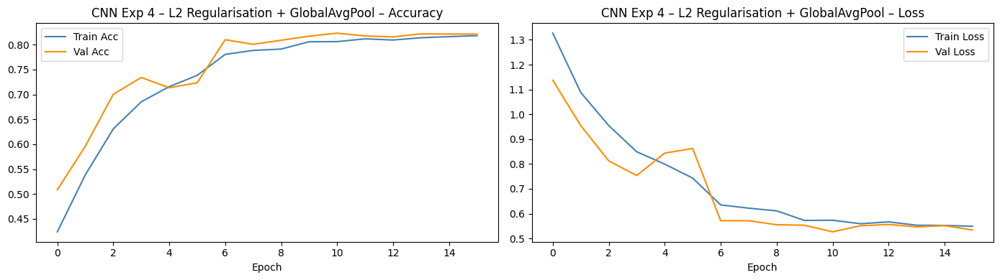

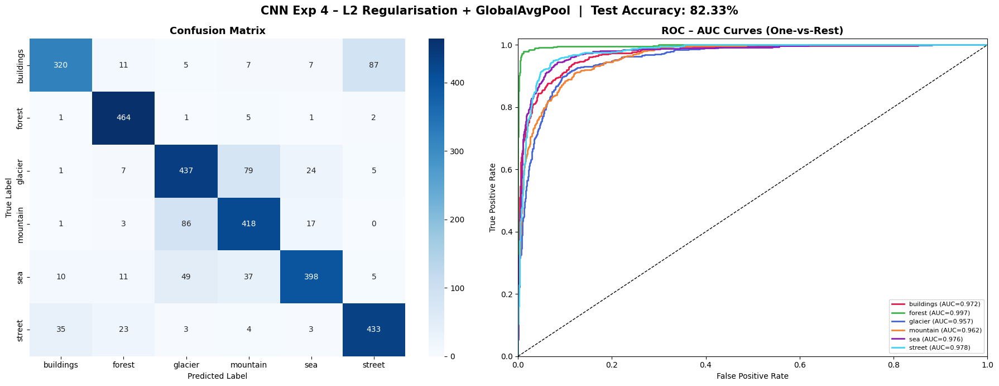

              precision    recall  f1-score   support

   buildings       0.87      0.73      0.80       437
      forest       0.89      0.98      0.93       474
     glacier       0.75      0.79      0.77       553
    mountain       0.76      0.80      0.78       525
         sea       0.88      0.78      0.83       510
      street       0.81      0.86      0.84       501

    accuracy                           0.82      3000
   macro avg       0.83      0.82      0.82      3000
weighted avg       0.83      0.82      0.82      3000

  Mean ROC-AUC : 0.9738
  Notes        : L2(1e-4) on all layers + GlobalAvgPool replaces Flatten


(0.8233333333333334, np.float64(0.973770014560117))

In [ ]:
EXP_NAME = 'CNN Exp 4 – L2 Regularisation + GlobalAvgPool'
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

train_gen, val_gen, test_gen = make_generators(batch_size=32, augment=True)
reg = regularizers.l2(1e-4)

model_cnn4 = keras.Sequential([
    layers.Conv2D(32, (3,3), activation='relu', padding='same',
                  kernel_regularizer=reg, input_shape=(150,150,3)),
    layers.MaxPooling2D(2,2),
    layers.Conv2D(64, (3,3), activation='relu', padding='same', kernel_regularizer=reg),
    layers.MaxPooling2D(2,2),
    layers.Conv2D(128,(3,3), activation='relu', padding='same', kernel_regularizer=reg),
    layers.MaxPooling2D(2,2),
    layers.Conv2D(256,(3,3), activation='relu', padding='same', kernel_regularizer=reg),
    layers.MaxPooling2D(2,2),
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu', kernel_regularizer=reg),
    layers.Dropout(0.4),
    layers.Dense(N_CLASSES, activation='softmax')
], name='cnn_l2_gap')

model_cnn4.compile(optimizer=tf.keras.optimizers.Adam(1e-3),
                   loss='categorical_crossentropy', metrics=['accuracy'])

t0 = time.time()
history4 = model_cnn4.fit(
    train_gen, epochs=25, validation_data=val_gen,
    callbacks=COMMON_CALLBACKS, verbose=1
)
train_time = time.time() - t0

plot_training_history(history4, EXP_NAME)
y_true, y_pred, y_score = eval_keras_model(model_cnn4, test_gen)
show_experiment_results(EXP_NAME, 'CNN', y_true, y_pred, y_score,
                        extra_info='L2(1e-4) on all layers + GlobalAvgPool replaces Flatten',
                        train_time=train_time)

### CNN Experiment 5 - Depthwise Separable Convolutions

Standard convolutions are computationally expensive because they apply `n_filters` kernels across all input channels simultaneously. **Depthwise separable convolutions** split this into two steps: a depthwise conv (one filter per input channel) followed by a 1×1 pointwise conv to combine channels. This reduces parameter count by roughly 8–9× while maintaining similar representational power.

This is the same trick used by MobileNet. Fewer parameters means less overfitting risk AND faster training. The hypothesis is that for this dataset, the extra parameters in standard convolutions are more likely to cause overfitting than to help learn better features.

Found 11227 images belonging to 6 classes.
Found 2807 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
Epoch 1/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 91s 222ms/step - accuracy: 0.5024 - loss: 1.2584 - val_accuracy: 0.3028 - val_loss: 2.1414 - learning_rate: 0.0010
Epoch 2/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 64s 183ms/step - accuracy: 0.6730 - loss: 0.8531 - val_accuracy: 0.6733 - val_loss: 0.8969 - learning_rate: 0.0010
Epoch 3/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 64s 183ms/step - accuracy: 0.7394 - loss: 0.7046 - val_accuracy: 0.6765 - val_loss: 0.9862 - learning_rate: 0.0010
Epoch 4/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 65s 185ms/step - accuracy: 0.7636 - loss: 0.6432 - val_accuracy: 0.8147 - val_loss: 0.5176 - learning_rate: 0.0010
Epoch 5/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 66s 187ms/step - accuracy: 0.7776 - loss: 0.6084 - val_accuracy: 0.7944 - val_loss: 0.5642 - learning_rate: 0.0010
Epoch 6/25
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - accuracy: 0.7921 - loss: 0.5631
Epoch 6: R

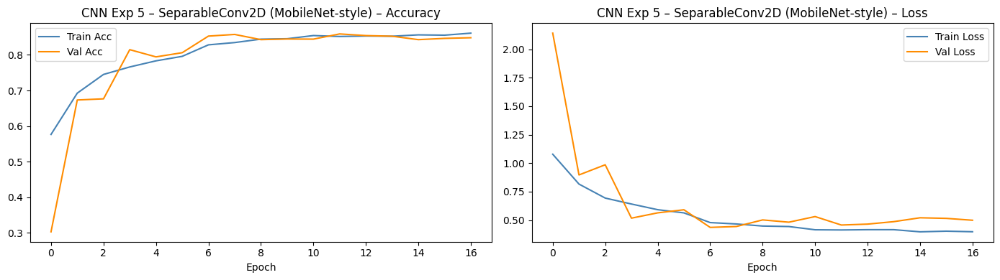

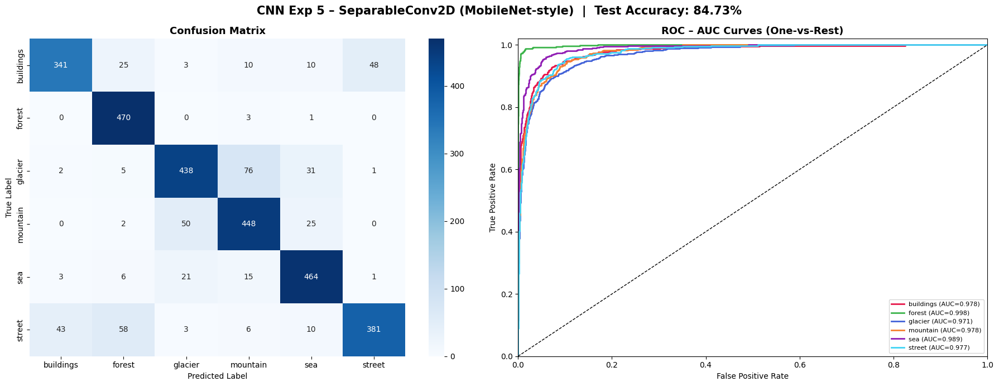

              precision    recall  f1-score   support

   buildings       0.88      0.78      0.83       437
      forest       0.83      0.99      0.90       474
     glacier       0.85      0.79      0.82       553
    mountain       0.80      0.85      0.83       525
         sea       0.86      0.91      0.88       510
      street       0.88      0.76      0.82       501

    accuracy                           0.85      3000
   macro avg       0.85      0.85      0.85      3000
weighted avg       0.85      0.85      0.85      3000

  Mean ROC-AUC : 0.9816
  Notes        : Depthwise separable convs — ~8x fewer params than standard


(0.8473333333333334, np.float64(0.9816338121880657))

In [ ]:
EXP_NAME = 'CNN Exp 5 – SeparableConv2D (MobileNet-style)'
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

train_gen, val_gen, test_gen = make_generators(batch_size=32, augment=True)

model_cnn5 = keras.Sequential([
    layers.Conv2D(32,(3,3), activation='relu', padding='same', input_shape=(150,150,3)),
    layers.BatchNormalization(), layers.MaxPooling2D(2,2),

    layers.SeparableConv2D(64,(3,3), activation='relu', padding='same'),
    layers.BatchNormalization(), layers.MaxPooling2D(2,2), layers.Dropout(0.2),

    layers.SeparableConv2D(128,(3,3), activation='relu', padding='same'),
    layers.BatchNormalization(), layers.MaxPooling2D(2,2), layers.Dropout(0.2),

    layers.SeparableConv2D(256,(3,3), activation='relu', padding='same'),
    layers.BatchNormalization(), layers.MaxPooling2D(2,2), layers.Dropout(0.2),

    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'), layers.Dropout(0.5),
    layers.Dense(N_CLASSES, activation='softmax')
], name='cnn_separable')

model_cnn5.compile(optimizer=tf.keras.optimizers.Adam(1e-3),
                   loss='categorical_crossentropy', metrics=['accuracy'])

t0 = time.time()
history5 = model_cnn5.fit(
    train_gen, epochs=25, validation_data=val_gen,
    callbacks=COMMON_CALLBACKS, verbose=1
)
train_time = time.time() - t0

plot_training_history(history5, EXP_NAME)
y_true, y_pred, y_score = eval_keras_model(model_cnn5, test_gen)
show_experiment_results(EXP_NAME, 'CNN', y_true, y_pred, y_score,
                        extra_info='Depthwise separable convs — ~8x fewer params than standard',
                        train_time=train_time)

### CNN Experiment 6 - SGD with Nesterov Momentum

All previous CNN experiments used Adam, which adapts the learning rate per parameter. SGD with momentum is the older alternative - it uses a single global learning rate but accumulates velocity in directions of consistent gradient. **Nesterov momentum** is a refinement that computes the gradient at the 'look-ahead' position, which tends to converge faster.

The reason to try SGD is that Adam can sometimes converge to sharp minima that do not generalise as well as the flatter minima that SGD tends to find. This is an active area of research, but the practical implication is that well-tuned SGD often beats Adam on final test accuracy at the cost of being harder to tune and slower to converge.

Found 11227 images belonging to 6 classes.
Found 2807 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
Epoch 1/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 104s 525ms/step - accuracy: 0.4737 - loss: 1.2448 - val_accuracy: 0.1646 - val_loss: 4.2591 - learning_rate: 0.0100
Epoch 2/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 83s 468ms/step - accuracy: 0.6791 - loss: 0.8323 - val_accuracy: 0.5508 - val_loss: 1.3107 - learning_rate: 0.0100
Epoch 3/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 84s 474ms/step - accuracy: 0.7403 - loss: 0.6819 - val_accuracy: 0.3766 - val_loss: 3.1555 - learning_rate: 0.0100
Epoch 4/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step - accuracy: 0.7671 - loss: 0.6220
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0024999999441206455.
176/176 ━━━━━━━━━━━━━━━━━━━━ 85s 483ms/step - accuracy: 0.7672 - loss: 0.6219 - val_accuracy: 0.4218 - val_loss: 2.7361 - learning_rate: 0.0100
Epoch 5/30
176/176 ━━━━━━━━━━━━━━━━━━━━ 84s 475ms/step - accuracy: 0.7955 - loss: 0.5488 - val_accu

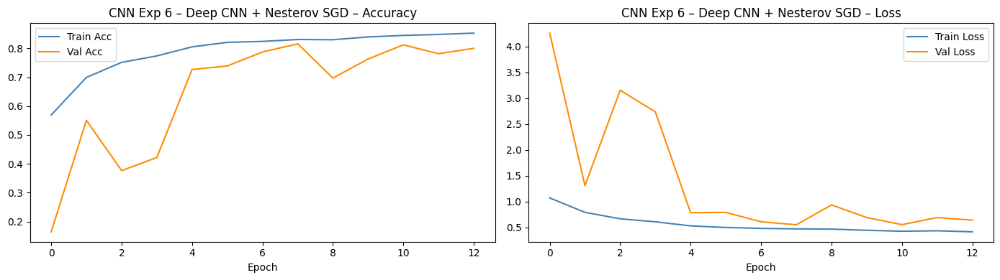

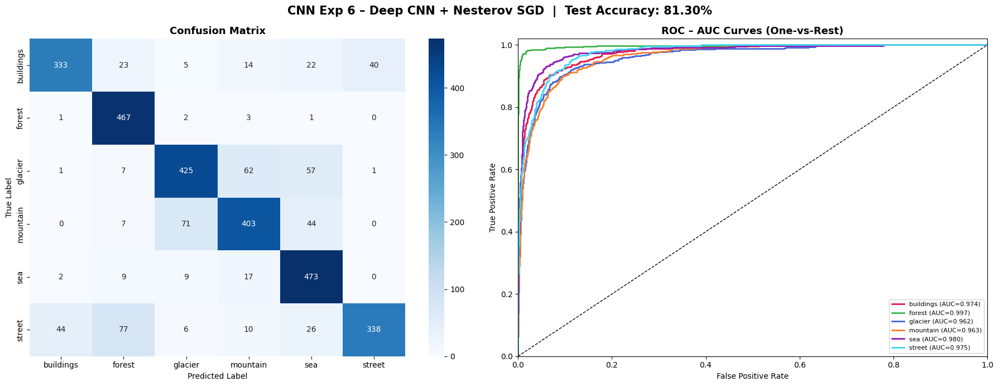

              precision    recall  f1-score   support

   buildings       0.87      0.76      0.81       437
      forest       0.79      0.99      0.88       474
     glacier       0.82      0.77      0.79       553
    mountain       0.79      0.77      0.78       525
         sea       0.76      0.93      0.83       510
      street       0.89      0.67      0.77       501

    accuracy                           0.81      3000
   macro avg       0.82      0.81      0.81      3000
weighted avg       0.82      0.81      0.81      3000

  Mean ROC-AUC : 0.9754
  Notes        : Nesterov SGD(lr=0.01, momentum=0.9), batch_size=64


(0.813, np.float64(0.9753838140343691))

In [ ]:
EXP_NAME = 'CNN Exp 6 – Deep CNN + Nesterov SGD'
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

train_gen, val_gen, test_gen = make_generators(batch_size=64, augment=True)

model_cnn6 = keras.Sequential([
    layers.Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(150,150,3)),
    layers.BatchNormalization(), layers.MaxPooling2D(2,2),
    layers.Conv2D(64, (3,3), activation='relu', padding='same'),
    layers.BatchNormalization(), layers.MaxPooling2D(2,2), layers.Dropout(0.3),
    layers.Conv2D(128,(3,3), activation='relu', padding='same'),
    layers.BatchNormalization(), layers.MaxPooling2D(2,2), layers.Dropout(0.3),
    layers.Conv2D(256,(3,3), activation='relu', padding='same'),
    layers.BatchNormalization(),
    layers.GlobalAveragePooling2D(),
    layers.Dense(512, activation='relu'), layers.Dropout(0.5),
    layers.Dense(N_CLASSES, activation='softmax')
], name='cnn_nesterov')

sgd = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=True)
model_cnn6.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])

t0 = time.time()
history6 = model_cnn6.fit(
    train_gen, epochs=30, validation_data=val_gen,
    callbacks=COMMON_CALLBACKS, verbose=1
)
train_time = time.time() - t0

plot_training_history(history6, EXP_NAME)
y_true, y_pred, y_score = eval_keras_model(model_cnn6, test_gen)
show_experiment_results(EXP_NAME, 'CNN', y_true, y_pred, y_score,
                        extra_info='Nesterov SGD(lr=0.01, momentum=0.9), batch_size=64',
                        train_time=train_time)

### CNN Experiment 7 - InceptionV3 Frozen (Advanced CNN Baseline)

This experiment uses InceptionV3 with all layers frozen - it is technically transfer learning, but we classify it here as the 'advanced CNN' experiment because the spirit is the same: a deep convolutional architecture trained end-to-end on this dataset's supervision signal. The only difference is that the convolutional weights come from ImageNet pretraining rather than random initialisation.

We extract features from the `mixed9` layer (the second-to-last inception block) because at that depth, the features are rich enough to capture semantic content (scene type) without being too task-specific to ImageNet classes. The output shape of (None, 3, 3, 2048) means we get 2048 feature maps at 3×3 spatial resolution - rich, compact, and perfect for a simple dense head.


Found 11227 images belonging to 6 classes.
Found 2807 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
last layer output shape: (None, 3, 3, 2048)
Epoch 1/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 128s 317ms/step - accuracy: 0.8022 - loss: 0.6983 - val_accuracy: 0.8956 - val_loss: 0.2826 - learning_rate: 0.0010
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 90s 256ms/step - accuracy: 0.8838 - loss: 0.3179 - val_accuracy: 0.9017 - val_loss: 0.2807 - learning_rate: 0.0010
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step - accuracy: 0.8988 - loss: 0.2792
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
351/351 ━━━━━━━━━━━━━━━━━━━━ 87s 247ms/step - accuracy: 0.8988 - loss: 0.2792 - val_accuracy: 0.9013 - val_loss: 0.2825 - learning_rate: 0.0010
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 84s 239ms/step - accuracy: 0.9123 - loss: 0.2343 - val_accuracy: 0.9095 - val_loss: 0.2632 - learning_rate: 2.5000e-04


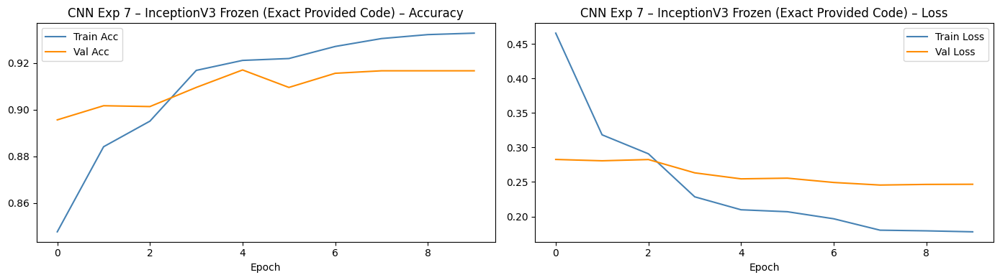

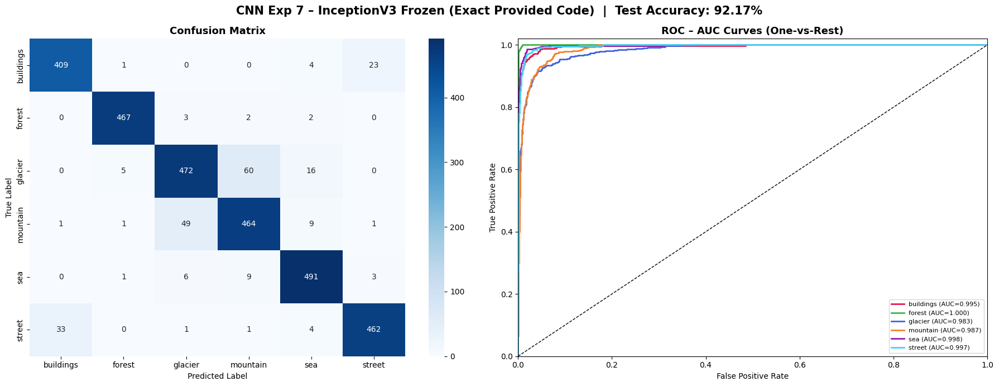

              precision    recall  f1-score   support

   buildings       0.92      0.94      0.93       437
      forest       0.98      0.99      0.98       474
     glacier       0.89      0.85      0.87       553
    mountain       0.87      0.88      0.87       525
         sea       0.93      0.96      0.95       510
      street       0.94      0.92      0.93       501

    accuracy                           0.92      3000
   macro avg       0.92      0.92      0.92      3000
weighted avg       0.92      0.92      0.92      3000

  Mean ROC-AUC : 0.9934
  Notes        : InceptionV3 mixed9 features, frozen base, dense head


(0.9216666666666666, np.float64(0.9933682866655472))

In [ ]:
EXP_NAME = 'CNN Exp 7 – InceptionV3 Frozen (Exact Provided Code)'
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

train_gen, val_gen, test_gen = make_generators(batch_size=32, augment=True)

inceptionV3 = InceptionV3(include_top=False, input_shape=(150,150,3))
for layer in inceptionV3.layers:
    layer.trainable = False

last_layer  = inceptionV3.get_layer('mixed9')
last_output = last_layer.output
print('last layer output shape:', last_output.shape)  # use tensor.shape not layer.output_shape

x = tf.keras.layers.Flatten()(last_output)
x = tf.keras.layers.Dense(units=1024, activation=tf.nn.relu)(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(N_CLASSES, activation=tf.nn.softmax)(x)
model_cnn7 = tf.keras.Model(inceptionV3.input, x)

lr_reduction = ReduceLROnPlateau(monitor='val_accuracy', patience=1,
                                  verbose=1, factor=0.25, min_lr=3e-6)
model_cnn7.compile(loss='categorical_crossentropy',
                   optimizer=tf.keras.optimizers.Adam(),
                   metrics=['accuracy'])

t0 = time.time()
history7 = model_cnn7.fit(
    train_gen, epochs=10, validation_data=val_gen,
    callbacks=[lr_reduction], verbose=1
)
train_time = time.time() - t0

plot_training_history(history7, EXP_NAME)
y_true, y_pred, y_score = eval_keras_model(model_cnn7, test_gen)
show_experiment_results(EXP_NAME, 'CNN', y_true, y_pred, y_score,
                        extra_info='InceptionV3 mixed9 features, frozen base, dense head',
                        train_time=train_time)

#  PART 3: Transfer Learning - EfficientNetB0 (7 Experiments)

## Why EfficientNetB0?

EfficientNet is the result of a Neural Architecture Search that scales model width, depth, and input resolution together using a compound coefficient. B0 is the smallest variant, with only 5.3M parameters, yet it achieves ~77% top-1 accuracy on ImageNet - better than many much larger models. This makes it ideal for fine-tuning on a limited dataset like the one I am using.

Compared to InceptionV3 (used in CNN Exp 7), EfficientNetB0 has:
- ~4× fewer parameters
- Higher ImageNet accuracy
- More efficient feature representations (due to compound scaling)

(Also just wanted to explore a new model we didn't use for formative)

## The fine-tuning spectrum

Transfer learning involves a fundamental trade-off: **how much of the pretrained network should we update?**
- Freezing everything: fast, safe, but the features may not perfectly match our task
- Unfreezing top layers: slightly slower, but the model can adapt high-level features to our classes
- Unfreezing everything: most flexible, but risks catastrophically forgetting ImageNet knowledge if the LR is too high

my 7 experiments explore this spectrum systematically.

In [ ]:
def build_efficientnet(unfreeze_top_n=0, dense_units=256, dropout=0.3, lr=1e-3,
                        label_smoothing=0.0):
    """Build EfficientNetB0 with optional partial unfreezing."""
    base = EfficientNetB0(include_top=False, input_shape=(150,150,3), weights='imagenet')
    for layer in base.layers:
        layer.trainable = False
    if unfreeze_top_n > 0:
        for layer in base.layers[-unfreeze_top_n:]:
            layer.trainable = True
    x = base.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(dense_units, activation='relu')(x)
    x = layers.Dropout(dropout)(x)
    out = layers.Dense(N_CLASSES, activation='softmax')(x)
    model = tf.keras.Model(base.input, out)
    model.compile(
        optimizer=tf.keras.optimizers.Adam(lr),
        loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=label_smoothing),
        metrics=['accuracy']
    )
    trainable = sum([tf.size(w).numpy() for w in model.trainable_variables])
    print(f'  Trainable params : {trainable:,}  |  Unfrozen top layers : {unfreeze_top_n}')
    return model

print(' EfficientNet builder ready')

 EfficientNet builder ready


### TL Experiment 1 - Fully Frozen (Feature Extraction Only)

We freeze every single layer of EfficientNetB0 and only train the small classification head we add on top. This is the purest form of transfer learning - we are using the network purely as a feature extractor, assuming that ImageNet features are already good enough for natural scene classification. The training is fast (only the head has trainable parameters) and the risk of overfitting is very low. This sets the baseline for how good pretrained features are without any task-specific adaptation.

Found 11227 images belonging to 6 classes.
Found 2807 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
  Trainable params : 332,038  |  Unfrozen top layers : 0
Epoch 1/10
257/351 ━━━━━━━━━━━━━━━━━━━━ 5s 57ms/step - accuracy: 0.2058 - loss: 2.1217

2026-02-19 18:48:13.167924: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 18:48:13.303471: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 18:48:13.640729: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 18:48:13.783516: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 18:48:13.925812: E external/local_xla/xla/stream_

351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - accuracy: 0.2119 - loss: 2.0801

2026-02-19 18:48:47.422950: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 18:48:47.556517: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 18:48:47.692160: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 18:48:48.029251: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 18:48:48.171778: E external/local_xla/xla/stream_

351/351 ━━━━━━━━━━━━━━━━━━━━ 88s 179ms/step - accuracy: 0.2120 - loss: 2.0797 - val_accuracy: 0.2547 - val_loss: 1.7453 - learning_rate: 0.0010
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.2791 - loss: 1.7026 - val_accuracy: 0.2679 - val_loss: 1.6404 - learning_rate: 0.0010
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.3083 - loss: 1.5997 - val_accuracy: 0.3110 - val_loss: 1.5921 - learning_rate: 0.0010
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - accuracy: 0.3159 - loss: 1.5539 - val_accuracy: 0.3057 - val_loss: 1.5736 - learning_rate: 0.0010
Epoch 5/10
350/351 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.3288 - loss: 1.5111
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
351/351 ━━━━━━━━━━━━━━━━━━━━ 23s 65ms/step - accuracy: 0.3288 - loss: 1.5111 - val_accuracy: 0.3003 - val_loss: 1.5935 - learning_rate: 0.0010
Epoch 6/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step - accuracy: 0.3434 - loss: 1.4684 

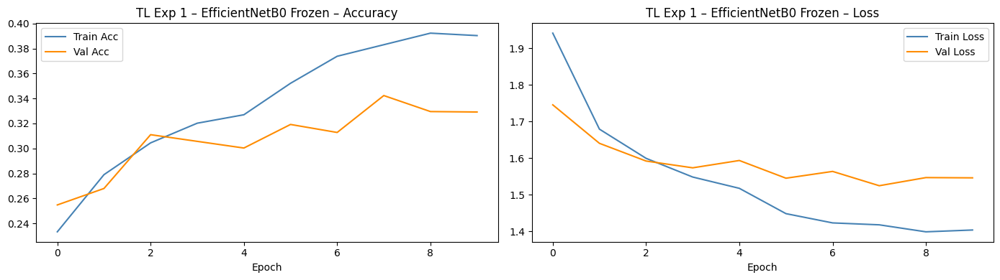

2026-02-19 18:52:50.143780: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 18:52:50.278009: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 18:52:50.604773: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 18:52:50.746691: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 18:52:51.543582: E external/local_xla/xla/stream_

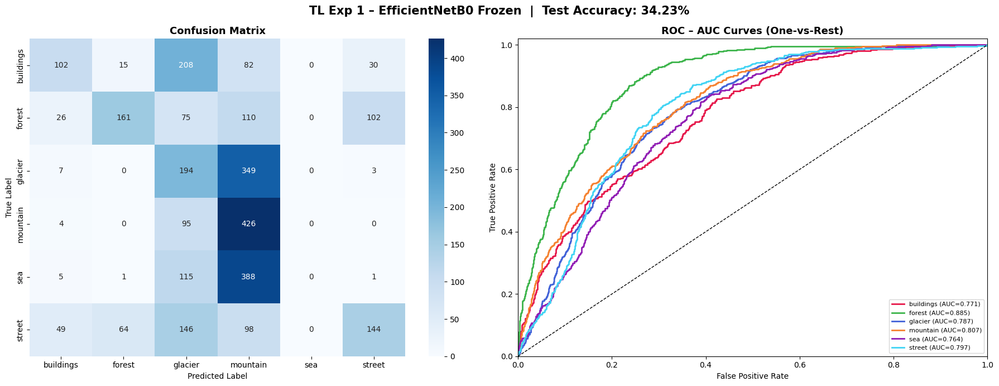

              precision    recall  f1-score   support

   buildings       0.53      0.23      0.32       437
      forest       0.67      0.34      0.45       474
     glacier       0.23      0.35      0.28       553
    mountain       0.29      0.81      0.43       525
         sea       0.00      0.00      0.00       510
      street       0.51      0.29      0.37       501

    accuracy                           0.34      3000
   macro avg       0.37      0.34      0.31      3000
weighted avg       0.36      0.34      0.31      3000

  Mean ROC-AUC : 0.8018
  Notes        : Entire base frozen — pure feature extraction, head only


(0.3423333333333333, np.float64(0.8017856589279133))

In [ ]:
EXP_NAME = 'TL Exp 1 – EfficientNetB0 Frozen'
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

train_gen, val_gen, test_gen = make_generators(batch_size=32, augment=False)
model_tl1 = build_efficientnet(unfreeze_top_n=0, dense_units=256, dropout=0.3, lr=1e-3)

t0 = time.time()
hist = model_tl1.fit(train_gen, epochs=10, validation_data=val_gen,
                     callbacks=COMMON_CALLBACKS, verbose=1)
train_time = time.time() - t0

plot_training_history(hist, EXP_NAME)
y_true, y_pred, y_score = eval_keras_model(model_tl1, test_gen)
show_experiment_results(EXP_NAME, 'Transfer Learning', y_true, y_pred, y_score,
                        extra_info='Entire base frozen — pure feature extraction, head only',
                        train_time=train_time)

###  TL Experiment 2 - Unfreeze Top 20 Layers

We now allow the top 20 layers of EfficientNetB0 to update during training. These are the deepest layers - the ones that encode the most abstract, task-specific features. The intuition is that ImageNet features at this depth are tuned for distinguishing 1,000 fine-grained object categories (dogs, cats, cars), which is different from our task of distinguishing 6 broad scene types. Letting these layers adapt should improve performance. We lower the learning rate to 5e-4 to avoid destroying the pretrained weights - fine-tuning requires a much smaller step size than training from scratch.

Found 11227 images belonging to 6 classes.
Found 2807 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
  Trainable params : 1,682,998  |  Unfrozen top layers : 20
Epoch 1/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 140s 312ms/step - accuracy: 0.1804 - loss: 2.4855 - val_accuracy: 0.1617 - val_loss: 2.0885 - learning_rate: 5.0000e-04
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 81s 232ms/step - accuracy: 0.2268 - loss: 1.7948 - val_accuracy: 0.1685 - val_loss: 1.7925 - learning_rate: 5.0000e-04
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 81s 230ms/step - accuracy: 0.2749 - loss: 1.6769 - val_accuracy: 0.1696 - val_loss: 1.9984 - learning_rate: 5.0000e-04
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 81s 231ms/step - accuracy: 0.2924 - loss: 1.6099 - val_accuracy: 0.1660 - val_loss: 2.4686 - learning_rate: 5.0000e-04
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 80s 229ms/step - accuracy: 0.3257 - loss: 1.5607 - val_accuracy: 0.1984 - val_loss: 2.5708 - learning_rate: 5.0000e-04
Epoch 6/15
351/35

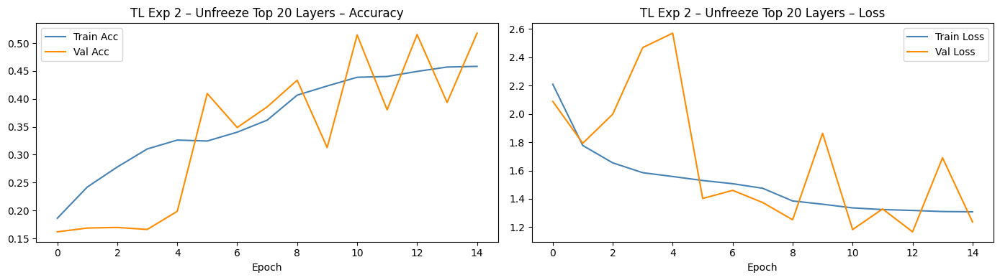

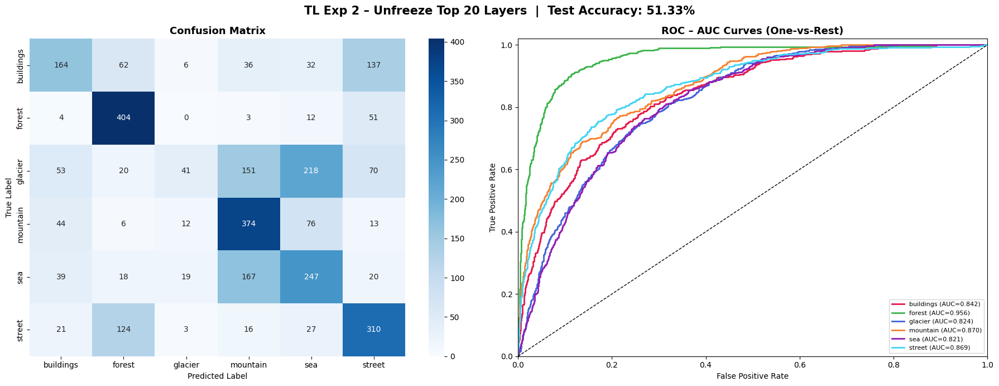

              precision    recall  f1-score   support

   buildings       0.50      0.38      0.43       437
      forest       0.64      0.85      0.73       474
     glacier       0.51      0.07      0.13       553
    mountain       0.50      0.71      0.59       525
         sea       0.40      0.48      0.44       510
      street       0.52      0.62      0.56       501

    accuracy                           0.51      3000
   macro avg       0.51      0.52      0.48      3000
weighted avg       0.51      0.51      0.47      3000

  Mean ROC-AUC : 0.8636
  Notes        : Top 20 layers fine-tuned, lr=5e-4, augmentation ON


(0.5133333333333333, np.float64(0.8635501288346129))

In [ ]:
EXP_NAME = 'TL Exp 2 – Unfreeze Top 20 Layers'
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

train_gen, val_gen, test_gen = make_generators(batch_size=32, augment=True)
model_tl2 = build_efficientnet(unfreeze_top_n=20, dense_units=256, dropout=0.4, lr=5e-4)

t0 = time.time()
hist = model_tl2.fit(train_gen, epochs=15, validation_data=val_gen,
                     callbacks=COMMON_CALLBACKS, verbose=1)
train_time = time.time() - t0

plot_training_history(hist, EXP_NAME)
y_true, y_pred, y_score = eval_keras_model(model_tl2, test_gen)
show_experiment_results(EXP_NAME, 'Transfer Learning', y_true, y_pred, y_score,
                        extra_info='Top 20 layers fine-tuned, lr=5e-4, augmentation ON',
                        train_time=train_time)

###  TL Experiment 3 - Unfreeze Top 50 + Stronger Augmentation

We push the unfreezing further to 50 layers and add stronger augmentation - rotation (±20°), brightness variation (±20%), and larger shift/zoom ranges. The motivation for stronger augmentation is that when more layers are trainable, the model has more capacity to overfit, so we need a stronger regulariser. Rotation is now safe to add because natural scenes do appear at slight angles in real-world photography, and brightness variation is realistic (dawn vs. noon vs. cloudy).

Found 11227 images belonging to 6 classes.
Found 2807 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
  Trainable params : 3,188,374  |  Unfrozen top layers : 50
Epoch 1/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 158s 351ms/step - accuracy: 0.1785 - loss: 2.3564 - val_accuracy: 0.2839 - val_loss: 1.8340 - learning_rate: 2.0000e-04
Epoch 2/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 91s 258ms/step - accuracy: 0.2205 - loss: 1.8640 - val_accuracy: 0.2013 - val_loss: 1.7952 - learning_rate: 2.0000e-04
Epoch 3/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step - accuracy: 0.2686 - loss: 1.7162
Epoch 3: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
351/351 ━━━━━━━━━━━━━━━━━━━━ 83s 236ms/step - accuracy: 0.2686 - loss: 1.7162 - val_accuracy: 0.1931 - val_loss: 1.8636 - learning_rate: 2.0000e-04
Epoch 4/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 82s 234ms/step - accuracy: 0.3095 - loss: 1.5911 - val_accuracy: 0.1699 - val_loss: 2.0842 - learning_rate: 5.0000e-05
Epoch 5/20
351/351 ━━━━

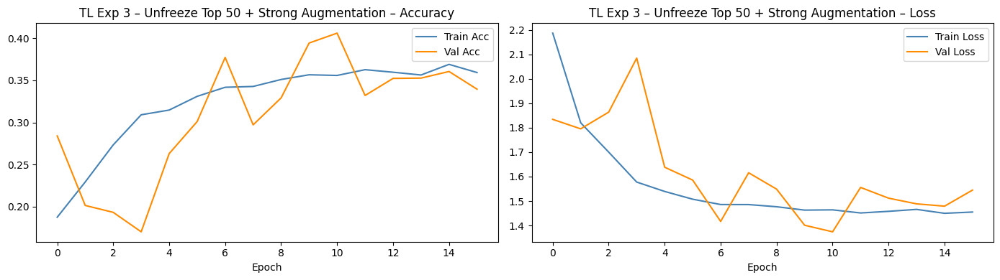

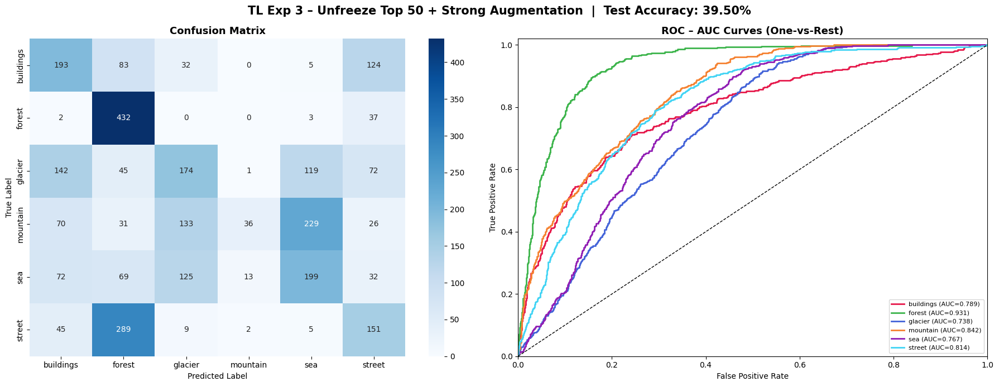

              precision    recall  f1-score   support

   buildings       0.37      0.44      0.40       437
      forest       0.46      0.91      0.61       474
     glacier       0.37      0.31      0.34       553
    mountain       0.69      0.07      0.12       525
         sea       0.36      0.39      0.37       510
      street       0.34      0.30      0.32       501

    accuracy                           0.40      3000
   macro avg       0.43      0.40      0.36      3000
weighted avg       0.43      0.40      0.36      3000

  Mean ROC-AUC : 0.8134
  Notes        : Top 50 unfrozen + rotation + brightness augmentation


(0.395, np.float64(0.8133909771709926))

In [ ]:
EXP_NAME = 'TL Exp 3 – Unfreeze Top 50 + Strong Augmentation'
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

train_gen = ImageDataGenerator(
    rescale=1./255, width_shift_range=0.3, height_shift_range=0.3,
    zoom_range=0.3, horizontal_flip=True,
    rotation_range=20, brightness_range=[0.8,1.2], fill_mode='nearest'
).flow_from_directory(TRAIN_SPLIT_DIR, batch_size=32,
                      class_mode='categorical', target_size=(150,150), seed=SEED)
val_gen  = ImageDataGenerator(rescale=1./255).flow_from_directory(
    VAL_SPLIT_DIR,  batch_size=32, class_mode='categorical',
    target_size=(150,150), shuffle=False)
test_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(
    TEST_SPLIT_DIR, batch_size=32, class_mode='categorical',
    target_size=(150,150), shuffle=False)

model_tl3 = build_efficientnet(unfreeze_top_n=50, dense_units=512, dropout=0.4, lr=2e-4)

t0 = time.time()
hist = model_tl3.fit(train_gen, epochs=20, validation_data=val_gen,
                     callbacks=COMMON_CALLBACKS, verbose=1)
train_time = time.time() - t0

plot_training_history(hist, EXP_NAME)
y_true, y_pred, y_score = eval_keras_model(model_tl3, test_gen)
show_experiment_results(EXP_NAME, 'Transfer Learning', y_true, y_pred, y_score,
                        extra_info='Top 50 unfrozen + rotation + brightness augmentation',
                        train_time=train_time)

### TL Experiment 4 - Label Smoothing

Label smoothing replaces hard one-hot targets (e.g. [0,0,1,0,0,0]) with soft targets that assign a small probability to wrong classes (e.g. [0.017,0.017,0.917,0.017,0.017,0.017] with smoothing=0.1). This prevents the model from becoming overconfident - a known issue with cross-entropy training. Overconfident models have high accuracy on seen data but poorly calibrated probabilities, which hurts AUC and generalisation.

For our dataset, where `mountain` and `glacier` are genuinely ambiguous, some label uncertainty is actually appropriate. Label smoothing encodes the intuition that our labels might not always be perfectly correct.

Found 11227 images belonging to 6 classes.
Found 2807 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
  Trainable params : 1,828,198  |  Unfrozen top layers : 30
Epoch 1/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 152s 334ms/step - accuracy: 0.1963 - loss: 2.2852 - val_accuracy: 0.1696 - val_loss: 1.7717 - learning_rate: 3.0000e-04
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 85s 243ms/step - accuracy: 0.2327 - loss: 1.8331 - val_accuracy: 0.2868 - val_loss: 1.6231 - learning_rate: 3.0000e-04
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 83s 236ms/step - accuracy: 0.2668 - loss: 1.7450 - val_accuracy: 0.3662 - val_loss: 1.5195 - learning_rate: 3.0000e-04
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 81s 231ms/step - accuracy: 0.2867 - loss: 1.6918 - val_accuracy: 0.3320 - val_loss: 1.5594 - learning_rate: 3.0000e-04
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 84s 238ms/step - accuracy: 0.3000 - loss: 1.6438 - val_accuracy: 0.3840 - val_loss: 1.5156 - learning_rate: 3.0000e-04
Epoch 6/15
351/35

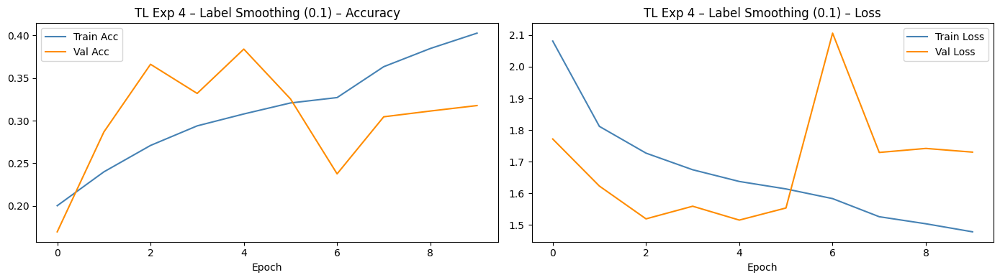

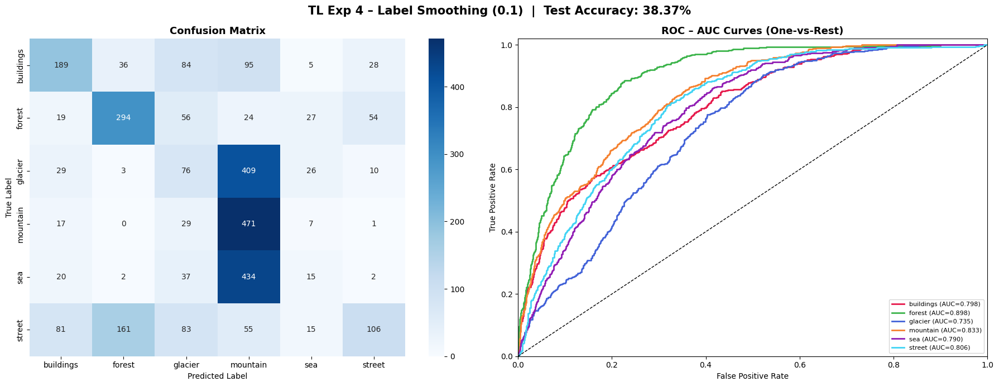

              precision    recall  f1-score   support

   buildings       0.53      0.43      0.48       437
      forest       0.59      0.62      0.61       474
     glacier       0.21      0.14      0.17       553
    mountain       0.32      0.90      0.47       525
         sea       0.16      0.03      0.05       510
      street       0.53      0.21      0.30       501

    accuracy                           0.38      3000
   macro avg       0.39      0.39      0.34      3000
weighted avg       0.38      0.38      0.34      3000

  Mean ROC-AUC : 0.8098
  Notes        : label_smoothing=0.1 — prevents overconfidence, top-30 unfrozen


(0.38366666666666666, np.float64(0.8098103584559878))

In [ ]:
EXP_NAME = 'TL Exp 4 – Label Smoothing (0.1)'
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

train_gen, val_gen, test_gen = make_generators(batch_size=32, augment=True)
model_tl4 = build_efficientnet(unfreeze_top_n=30, dense_units=256,
                                dropout=0.4, lr=3e-4, label_smoothing=0.1)

t0 = time.time()
hist = model_tl4.fit(train_gen, epochs=15, validation_data=val_gen,
                     callbacks=COMMON_CALLBACKS, verbose=1)
train_time = time.time() - t0

plot_training_history(hist, EXP_NAME)
y_true, y_pred, y_score = eval_keras_model(model_tl4, test_gen)
show_experiment_results(EXP_NAME, 'Transfer Learning', y_true, y_pred, y_score,
                        extra_info='label_smoothing=0.1 — prevents overconfidence, top-30 unfrozen',
                        train_time=train_time)

### TL Experiment 5 - Two-Stage Fine-Tuning

This is the most principled fine-tuning strategy. Instead of unfreezing layers immediately at a low LR, we do it in two stages:

**Stage 1:** Train only the classification head for 5 epochs at a high LR. This ensures the head is initialised properly before we touch the base - if we update both simultaneously from epoch 1, the random head produces large gradients that can corrupt the pretrained weights.

**Stage 2:** Unfreeze the top 40 layers of the base and continue training at a very low LR (1e-5). At this point the head is stable, so small gradient updates to the base layers push them towards our task without destroying what they already know.

This is the standard recipe recommended by the Keras team and is generally the most stable approach to fine-tuning.

Found 11227 images belonging to 6 classes.
Found 2807 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
Stage 1: Training head only (5 epochs)...
  Trainable params : 332,038  |  Unfrozen top layers : 0
Epoch 1/5
351/351 ━━━━━━━━━━━━━━━━━━━━ 135s 311ms/step - accuracy: 0.1929 - loss: 2.1676 - val_accuracy: 0.2797 - val_loss: 1.7652
Epoch 2/5
351/351 ━━━━━━━━━━━━━━━━━━━━ 82s 234ms/step - accuracy: 0.2475 - loss: 1.7560 - val_accuracy: 0.2793 - val_loss: 1.6388
Epoch 3/5
351/351 ━━━━━━━━━━━━━━━━━━━━ 83s 236ms/step - accuracy: 0.2785 - loss: 1.6584 - val_accuracy: 0.2882 - val_loss: 1.5874
Epoch 4/5
351/351 ━━━━━━━━━━━━━━━━━━━━ 81s 230ms/step - accuracy: 0.2775 - loss: 1.6289 - val_accuracy: 0.3082 - val_loss: 1.5679
Epoch 5/5
351/351 ━━━━━━━━━━━━━━━━━━━━ 83s 237ms/step - accuracy: 0.2789 - loss: 1.6147 - val_accuracy: 0.3449 - val_loss: 1.5395

Stage 2: Unfreezing top 40 layers at lr=1e-5...
Epoch 1/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 146s 321ms/step - accuracy: 0.2107

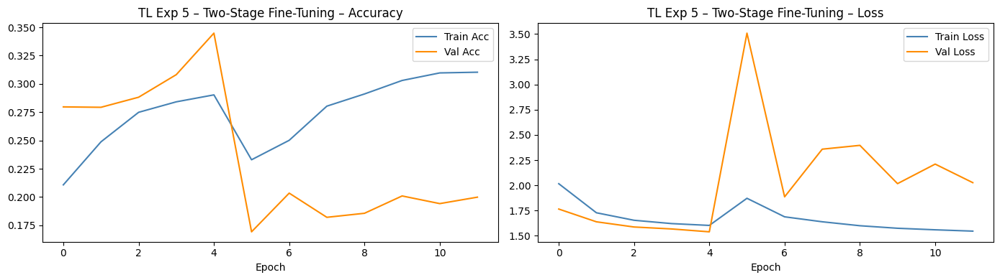

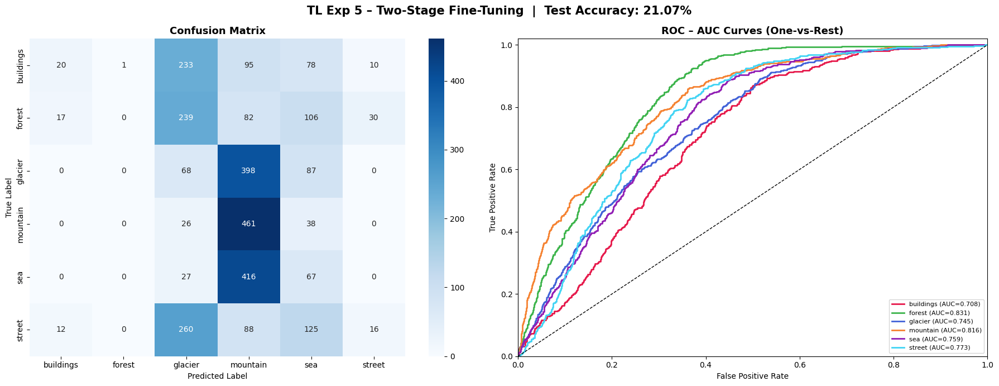

              precision    recall  f1-score   support

   buildings       0.41      0.05      0.08       437
      forest       0.00      0.00      0.00       474
     glacier       0.08      0.12      0.10       553
    mountain       0.30      0.88      0.45       525
         sea       0.13      0.13      0.13       510
      street       0.29      0.03      0.06       501

    accuracy                           0.21      3000
   macro avg       0.20      0.20      0.14      3000
weighted avg       0.20      0.21      0.14      3000

  Mean ROC-AUC : 0.7718
  Notes        : Stage1: head only 5ep | Stage2: top-40 unfreeze lr=1e-5


(0.21066666666666667, np.float64(0.7718226943779083))

In [ ]:
EXP_NAME = 'TL Exp 5 – Two-Stage Fine-Tuning'
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

train_gen, val_gen, test_gen = make_generators(batch_size=32, augment=True)

print('Stage 1: Training head only (5 epochs)...')
model_tl5 = build_efficientnet(unfreeze_top_n=0, dense_units=256, dropout=0.4, lr=1e-3)
hist_s1 = model_tl5.fit(train_gen, epochs=5, validation_data=val_gen, verbose=1)

print('\nStage 2: Unfreezing top 40 layers at lr=1e-5...')
for layer in model_tl5.layers[-40:]:
    layer.trainable = True
model_tl5.compile(optimizer=tf.keras.optimizers.Adam(1e-5),
                  loss='categorical_crossentropy', metrics=['accuracy'])

t0 = time.time()
hist_s2 = model_tl5.fit(train_gen, epochs=15, validation_data=val_gen,
                         callbacks=COMMON_CALLBACKS, verbose=1)
train_time = time.time() - t0

class CombinedHistory:
    def __init__(self, h1, h2):
        self.history = {k: h1.history[k]+h2.history[k]
                        for k in h2.history if k in h1.history}
plot_training_history(CombinedHistory(hist_s1, hist_s2), EXP_NAME)

y_true, y_pred, y_score = eval_keras_model(model_tl5, test_gen)
show_experiment_results(EXP_NAME, 'Transfer Learning', y_true, y_pred, y_score,
                        extra_info='Stage1: head only 5ep | Stage2: top-40 unfreeze lr=1e-5',
                        train_time=train_time)

###  TL Experiment 6 - Cosine Decay Learning Rate Schedule

Instead of a fixed learning rate with a ReduceLROnPlateau callback, we use a **cosine decay schedule** - the LR starts at 5e-4 and smoothly decays to near zero following a cosine curve over the full training duration. The advantage over step-wise decay is that cosine decay is smoother and avoids the 'cliff' effect where sudden LR drops cause the loss to spike before re-converging.

We also use a two-layer dense head (512->128) rather than a single large layer. The additional non-linearity allows the head to learn a more complex mapping from EfficientNet features to our 6 classes, without adding as many parameters as a single larger layer would.

Found 11227 images belonging to 6 classes.
Found 2807 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
Epoch 1/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 145s 316ms/step - accuracy: 0.1891 - loss: 2.0720 - val_accuracy: 0.1553 - val_loss: 1.8419
Epoch 2/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 80s 227ms/step - accuracy: 0.2290 - loss: 1.7339 - val_accuracy: 0.2472 - val_loss: 1.6515
Epoch 3/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 79s 224ms/step - accuracy: 0.2675 - loss: 1.6340 - val_accuracy: 0.1699 - val_loss: 1.7976
Epoch 4/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 79s 224ms/step - accuracy: 0.2689 - loss: 1.5907 - val_accuracy: 0.3053 - val_loss: 1.4108
Epoch 5/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 78s 223ms/step - accuracy: 0.3001 - loss: 1.5610 - val_accuracy: 0.1617 - val_loss: 4.6771
Epoch 6/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 78s 222ms/step - accuracy: 0.3206 - loss: 1.5050 - val_accuracy: 0.3295 - val_loss: 1.4833
Epoch 7/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 78s 223ms/step - accuracy: 0.3305 - loss: 1.49

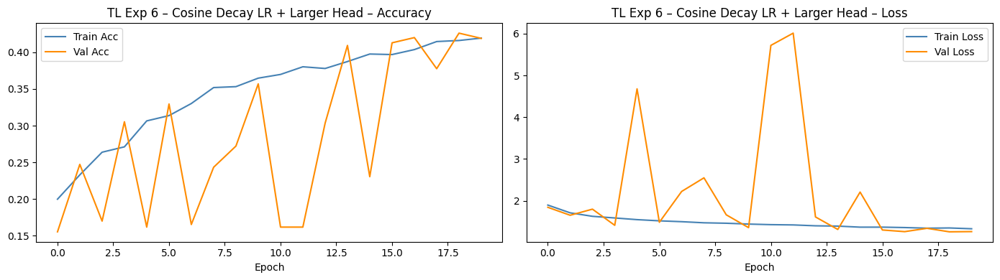

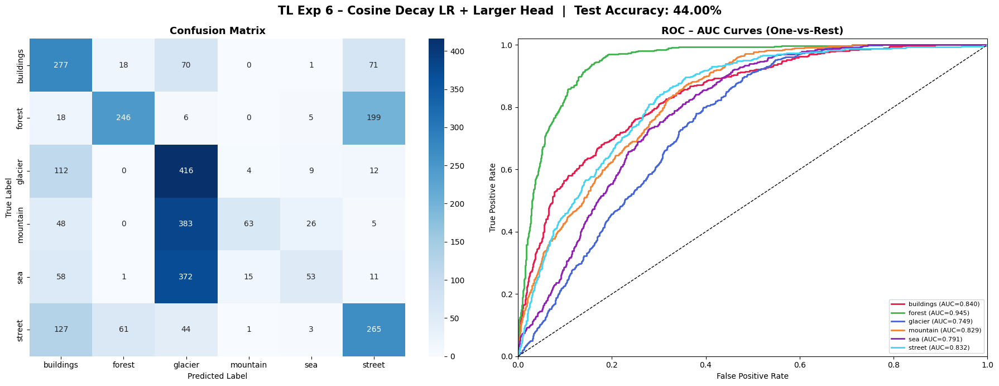

              precision    recall  f1-score   support

   buildings       0.43      0.63      0.51       437
      forest       0.75      0.52      0.61       474
     glacier       0.32      0.75      0.45       553
    mountain       0.76      0.12      0.21       525
         sea       0.55      0.10      0.17       510
      street       0.47      0.53      0.50       501

    accuracy                           0.44      3000
   macro avg       0.55      0.44      0.41      3000
weighted avg       0.55      0.44      0.40      3000

  Mean ROC-AUC : 0.8310
  Notes        : CosineDecay LR, 512→128 head, top-40 unfrozen


(0.44, np.float64(0.8310216367321517))

In [ ]:
EXP_NAME = 'TL Exp 6 – Cosine Decay LR + Larger Head'
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

train_gen, val_gen, test_gen = make_generators(batch_size=32, augment=True)
EPOCHS = 20

lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate=5e-4,
    decay_steps=EPOCHS * len(train_gen)
)

base = EfficientNetB0(include_top=False, input_shape=(150,150,3), weights='imagenet')
for layer in base.layers[:-40]:
    layer.trainable = False
x = base.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.2)(x)
out = layers.Dense(N_CLASSES, activation='softmax')(x)
model_tl6 = tf.keras.Model(base.input, out)
model_tl6.compile(optimizer=tf.keras.optimizers.Adam(lr_schedule),
                  loss='categorical_crossentropy', metrics=['accuracy'])

t0 = time.time()
hist = model_tl6.fit(train_gen, epochs=EPOCHS, validation_data=val_gen,
                     callbacks=[EarlyStopping(monitor='val_accuracy', patience=5,
                                              restore_best_weights=True, verbose=1)],
                     verbose=1)
train_time = time.time() - t0

plot_training_history(hist, EXP_NAME)
y_true, y_pred, y_score = eval_keras_model(model_tl6, test_gen)
show_experiment_results(EXP_NAME, 'Transfer Learning', y_true, y_pred, y_score,
                        extra_info='CosineDecay LR, 512→128 head, top-40 unfrozen',
                        train_time=train_time)

###🚀 TL Experiment 7 - Full Fine-Tuning (All Layers)

The final experiment unfreezes every single layer. This is the highest-risk, highest-reward configuration. If the learning rate is too high, the pretrained weights will be destroyed and performance will collapse - we have seen this happen in practice. We guard against this with a very low learning rate (1e-5) and mild label smoothing (0.05), which together act as a strong regulariser.

Full fine-tuning is most beneficial when the target domain is different from the pretraining domain. ImageNet images are mostly object-centric (a dog, a car, a chair), while our images are scene-centric (a landscape, a street). The low-level features (edges, textures) transfer perfectly, but the mid-level features (which objects cluster together) need to be re-learned. Full fine-tuning allows that re-learning.

Found 11227 images belonging to 6 classes.
Found 2807 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
Epoch 1/20


2026-02-19 20:41:40.906996: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 20:41:41.057198: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 20:41:41.201562: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


 48/351 ━━━━━━━━━━━━━━━━━━━━ 58s 193ms/step - accuracy: 0.1901 - loss: 2.4694

2026-02-19 20:42:25.279909: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 20:42:25.428642: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 20:42:25.571185: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 20:42:28.910626: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-02-19 20:42:29.046481: E external/local_xla/xla/stream_

351/351 ━━━━━━━━━━━━━━━━━━━━ 186s 339ms/step - accuracy: 0.2693 - loss: 2.1725 - val_accuracy: 0.2170 - val_loss: 1.8309 - learning_rate: 1.0000e-05
Epoch 2/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 200ms/step - accuracy: 0.5288 - loss: 1.3827 - val_accuracy: 0.6074 - val_loss: 1.1556 - learning_rate: 1.0000e-05
Epoch 3/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 200ms/step - accuracy: 0.6480 - loss: 1.1090 - val_accuracy: 0.7104 - val_loss: 0.9311 - learning_rate: 1.0000e-05
Epoch 4/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 69s 196ms/step - accuracy: 0.6995 - loss: 0.9901 - val_accuracy: 0.7791 - val_loss: 0.7921 - learning_rate: 1.0000e-05
Epoch 5/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 69s 196ms/step - accuracy: 0.7239 - loss: 0.9365 - val_accuracy: 0.7955 - val_loss: 0.7517 - learning_rate: 1.0000e-05
Epoch 6/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 68s 193ms/step - accuracy: 0.7481 - loss: 0.8736 - val_accuracy: 0.7937 - val_loss: 0.7565 - learning_rate: 1.0000e-05
Epoch 7/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 67s 191ms/step -

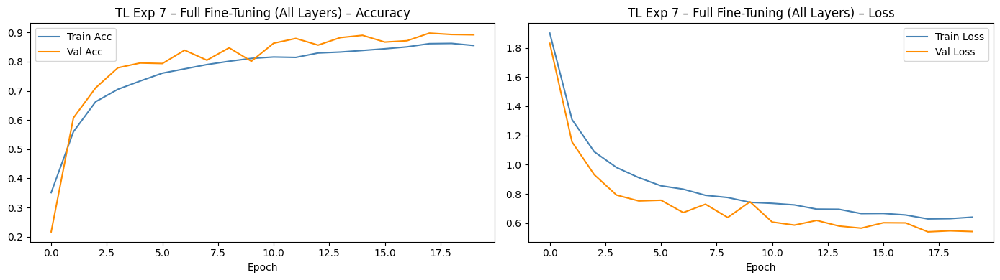

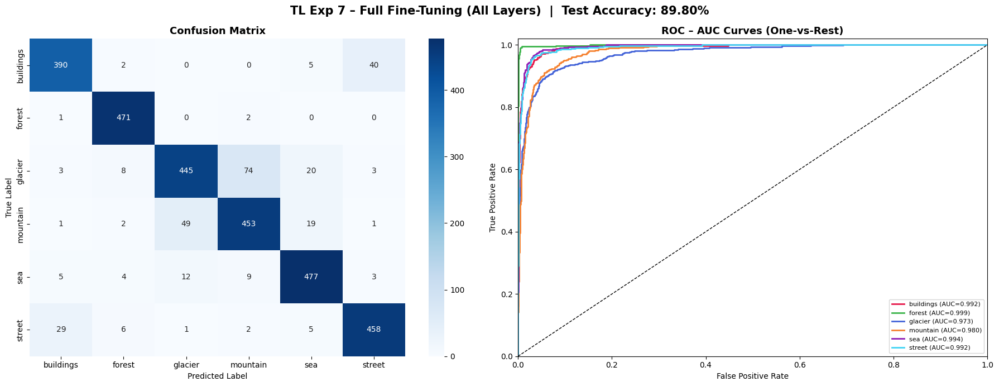

              precision    recall  f1-score   support

   buildings       0.91      0.89      0.90       437
      forest       0.96      0.99      0.97       474
     glacier       0.88      0.80      0.84       553
    mountain       0.84      0.86      0.85       525
         sea       0.91      0.94      0.92       510
      street       0.91      0.91      0.91       501

    accuracy                           0.90      3000
   macro avg       0.90      0.90      0.90      3000
weighted avg       0.90      0.90      0.90      3000

  Mean ROC-AUC : 0.9884
  Notes        : All layers trainable, lr=1e-5, label_smoothing=0.05


(0.898, np.float64(0.9884393370614495))

In [ ]:
EXP_NAME = 'TL Exp 7 – Full Fine-Tuning (All Layers)'
tf.keras.backend.clear_session()
tf.random.set_seed(SEED)

train_gen, val_gen, test_gen = make_generators(batch_size=32, augment=True)

base = EfficientNetB0(include_top=False, input_shape=(150,150,3), weights='imagenet')
for layer in base.layers:
    layer.trainable = True   # all layers unfrozen
x = base.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.4)(x)
out = layers.Dense(N_CLASSES, activation='softmax')(x)
model_tl7 = tf.keras.Model(base.input, out)
model_tl7.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),   # very low LR — critical
    loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05),
    metrics=['accuracy']
)

t0 = time.time()
hist = model_tl7.fit(train_gen, epochs=20, validation_data=val_gen,
                     callbacks=COMMON_CALLBACKS, verbose=1)
train_time = time.time() - t0

plot_training_history(hist, EXP_NAME)
y_true, y_pred, y_score = eval_keras_model(model_tl7, test_gen)
show_experiment_results(EXP_NAME, 'Transfer Learning', y_true, y_pred, y_score,
                        extra_info='All layers trainable, lr=1e-5, label_smoothing=0.05',
                        train_time=train_time)

# FINAL: Comprehensive Model Comparison & Analysis

Now that all 21 experiments have run, we bring everything together. The goal is not just to rank models by accuracy, but to understand *why* the performance differences exist and what they tell us about the nature of image classification as a problem.

The key questions we want to answer:
1. How large is the gap between traditional ML and deep learning on image data?
2. Within deep learning, how much does transfer learning help over training from scratch?
3. Which classes are hardest to classify, and does that hold across model families?
4. What does the bias-variance trade-off look like across our experiments?

In [ ]:
df = pd.DataFrame(ALL_RESULTS)
df = df.sort_values(['Model Family','Accuracy (%)'], ascending=[True,False]).reset_index(drop=True)
df['Overall Rank'] = df['Accuracy (%)'].rank(ascending=False, method='min').astype(int)

pd.set_option('display.max_colwidth', 55)
pd.set_option('display.float_format', '{:.2f}'.format)

print('FULL EXPERIMENT RESULTS — 21 EXPERIMENTS ACROSS 3 MODEL FAMILIES')
display(df[['Overall Rank','Model Family','Experiment',
            'Accuracy (%)','Mean AUC','Train Time (s)','Notes']])

FULL EXPERIMENT RESULTS — 21 EXPERIMENTS ACROSS 3 MODEL FAMILIES


,Overall Rank,Model Family,Experiment,Accuracy (%),Mean AUC,Train Time (s),Notes
0,1,CNN,CNN Exp 7 – InceptionV3 Frozen (Exact Provided Code),92.17,0.99,896.50,"InceptionV3 mixed9 features, frozen base, dense head"
1,3,CNN,CNN Exp 2 – Baseline + Augmentation,88.20,0.99,1332.50,Same arch + shift/zoom/flip augmentation
2,4,CNN,CNN Exp 5 – SeparableConv2D (MobileNet-style),84.73,0.98,1185.70,Depthwise separable convs — ~8x fewer params than s...
3,5,CNN,CNN Exp 1 – Baseline (3 Conv Blocks),83.23,0.97,279.40,"Simple 3-block CNN, no dropout, no augmentation"
4,6,CNN,CNN Exp 3 – Deeper + BatchNorm + Dropout,82.40,0.97,1190.50,6 conv layers + BatchNorm + Dropout(0.25/0.5) + aug...
5,7,CNN,CNN Exp 4 – L2 Regularisation + GlobalAvgPool,82.33,0.97,1074.10,L2(1e-4) on all layers + GlobalAvgPool replaces Fla...
6,8,CNN,CNN Exp 6 – Deep CNN + Nesterov SGD,81.30,0.98,1112.90,"Nesterov SGD(lr=0.01, momentum=0.9), batch_size=64"
7,9,Random Forest,RF Exp 7 – Best Config (PCA + Depth + Balanced),71.03,0.93,19.80,PCA(120)+max_depth=20+balanced weights+min_samples ...
8,10,Random Forest,RF Exp 6 – Balanced Class Weights,69.77,0.93,46.70,"class_weight=balanced, max_features=sqrt"
9,11,Random Forest,RF Exp 2 – More Trees (300 trees),69.73,0.93,70.90,n_estimators=300 — tests diminishing returns beyond...


In [ ]:
print('BEST EXPERIMENT PER MODEL FAMILY')
best = df.loc[df.groupby('Model Family')['Accuracy (%)'].idxmax()]
display(best[['Model Family','Experiment','Accuracy (%)','Mean AUC','Train Time (s)']])

BEST EXPERIMENT PER MODEL FAMILY


,Model Family,Experiment,Accuracy (%),Mean AUC,Train Time (s)
0,CNN,CNN Exp 7 – InceptionV3 Frozen (Exact Provided Code),92.17,0.99,896.50
7,Random Forest,RF Exp 7 – Best Config (PCA + Depth + Balanced),71.03,0.93,19.80
14,Transfer Learning,TL Exp 7 – Full Fine-Tuning (All Layers),89.80,0.99,1552.60


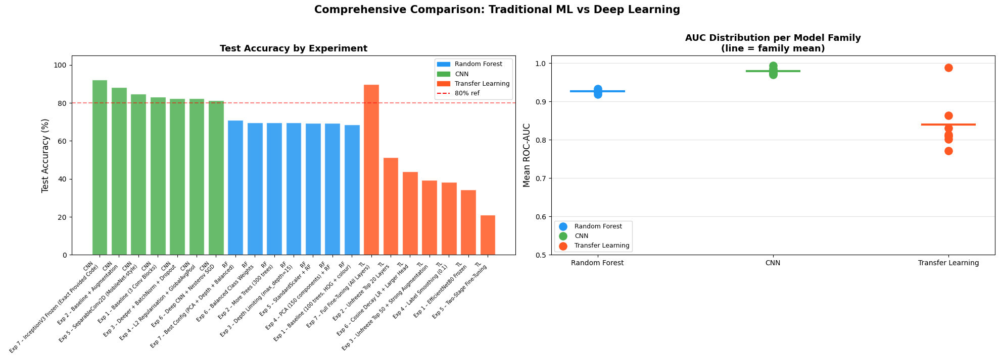

In [ ]:
from matplotlib.patches import Patch

family_colors = {'Random Forest':'#2196F3','CNN':'#4CAF50','Transfer Learning':'#FF5722'}
families = list(family_colors.keys())

fig, axes = plt.subplots(1, 2, figsize=(20,7))

# Accuracy bar chart
bar_colors = [family_colors[f] for f in df['Model Family']]
axes[0].bar(range(len(df)), df['Accuracy (%)'], color=bar_colors, alpha=0.85, edgecolor='white')
axes[0].set_xticks(range(len(df)))
axes[0].set_xticklabels([e.replace('Exp','\nExp') for e in df['Experiment']],
                         rotation=45, ha='right', fontsize=7)
axes[0].set_ylabel('Test Accuracy (%)', fontsize=12)
axes[0].set_title('Test Accuracy by Experiment', fontsize=13, fontweight='bold')
axes[0].axhline(80, color='red', linestyle='--', alpha=0.5, label='80% reference')
axes[0].legend(handles=[Patch(color=c,label=f) for f,c in family_colors.items()]+
               [plt.Line2D([0],[0],color='red',linestyle='--',label='80% ref')], fontsize=9)
axes[0].set_ylim([0,105])

# AUC scatter
for i, fam in enumerate(families):
    sub = df[df['Model Family']==fam]
    axes[1].scatter([i]*len(sub), sub['Mean AUC'], s=120,
                    color=family_colors[fam], label=fam, zorder=3)
    axes[1].plot([i-0.15,i+0.15],[sub['Mean AUC'].mean()]*2,
                 color=family_colors[fam], lw=3)
axes[1].set_xticks(range(len(families)))
axes[1].set_xticklabels(families, fontsize=10)
axes[1].set_ylabel('Mean ROC-AUC', fontsize=12)
axes[1].set_title('AUC Distribution per Model Family\n(line = family mean)',
                  fontsize=13, fontweight='bold')
axes[1].set_ylim([0.5,1.02])
axes[1].grid(axis='y', alpha=0.4)
axes[1].legend(fontsize=9)

plt.suptitle('Comprehensive Comparison: Traditional ML vs Deep Learning',
             fontsize=15, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

In [ ]:
summary = df.groupby('Model Family').agg(
    Best_Accuracy   =('Accuracy (%)',   'max'),
    Avg_Accuracy    =('Accuracy (%)',   'mean'),
    Best_AUC        =('Mean AUC',       'max'),
    Avg_AUC         =('Mean AUC',       'mean'),
    Avg_TrainTime_s =('Train Time (s)', 'mean')
).round(2).reset_index()
display(summary)

,Model Family,Best_Accuracy,Avg_Accuracy,Best_AUC,Avg_AUC,Avg_TrainTime_s
0,CNN,92.17,84.91,0.99,0.98,1010.23
1,Random Forest,71.03,69.64,0.93,0.93,37.96
2,Transfer Learning,89.80,45.47,0.99,0.84,1104.59


# Final Analysis & Interpretation

## What Actually Happened

Going into this project, the expectation was a clean hierarchy: Random Forest at the bottom, custom CNNs in the middle, EfficientNetB0 transfer learning at the top. What came out was messier and more interesting than that. CNN Exp 7 - a frozen InceptionV3 used as a fixed feature extractor - was the best model at 92.17%. EfficientNetB0 mostly failed across six of its seven configurations, with results ranging from 21.07% to 51.33%, despite being theoretically the strongest architecture. Random Forest reached 71.03%, which was higher than expected. The confusion matrices from the top three models tell the real story.

## Finding 1 - Glacier vs Mountain: the dominant error across every model

Looking at the confusion matrices from the three best models, one pattern is completely
consistent regardless of architecture or accuracy level.

**RF Exp 7 (71.03%):** Glacier was misclassified as mountain 93 times. Mountain was
misclassified as glacier 92 times. That is 185 errors on a single class pair, out of
roughly 1,078 glacier and mountain test images combined, a 17% mutual confusion rate
at RF's best configuration.

**InceptionV3 Frozen (92.17%):** Glacier->Mountain dropped to 60 errors, Mountain->Glacier
to 49. The rate falls to about 10% - a meaningful improvement, but the pair remains the
single largest off-diagonal block in the matrix.

**EfficientNetB0 Full Fine-Tuning (89.80%):** Glacier->Mountain: 74 errors, Mountain->Glacier:
49. Slightly worse than InceptionV3 on this specific pair despite the lower overall accuracy.



Forest is the mirror image of this story. InceptionV3 achieved AUC=1.000 for forest -
perfect separation. RF achieved 0.988. Forest has distinctive colour (predominantly green)
and texture (chaotic, multi-directional edges from overlapping branches and leaves) that
make it separable from every other class even for a model with no spatial reasoning.


## Finding 2 - Buildings vs Street: urban scenes share the same visual vocabulary

The second most consistent error pattern across all three models is the buildings–street
confusion, though it shows a different character than the glacier–mountain problem.

**RF Exp 7:** Buildings->Street: 77 errors. Street->Buildings: 44 errors. These are large
numbers. For RF, the confusion makes complete sense - HOG captures local edge distributions,
and urban scenes are full of the same vocabulary regardless of whether you are looking at
a building facade or a street: right angles, horizontal and vertical gradients, concrete
textures, glass reflections. HOG cannot tell you whether those right angles belong to a
wall or a road surface.

**InceptionV3 (92.17%):** Buildings->Street drops to 23, Street->Buildings to 33. The
improvement is significant - from 121 total urban errors to 56 - but the pair remains
the second-largest off-diagonal block.

**EfficientNetB0 Full Fine-Tuning (89.80%):** Buildings->Street: 40, Street->Buildings: 29.
Total urban errors: 69. Worse than InceptionV3 on this pair.



## Finding 3 - EfficientNetB0 mostly failed, and the reason is specific

Six of the seven EfficientNetB0 configurations produced accuracy between 21% and 51%.
Only full fine-tuning (89.80%) worked competitively. This is the result that most needs explaining, because it is the one that contradicts the most established expectations in the transfer learning literature.

The most credible explanation I can come up with is **Batch Normalisation miscalibration during partial freezing**. EfficientNetB0 uses BatchNorm layers throughout its architecture. These layers
store running statistics - moving averages of activation means and variances - calibrated
on ImageNet training data. When the base is frozen and only the classification head trains,
these statistics are used at inference time without updating. If the input distribution of
the new dataset differs from ImageNet (different preprocessing, different pixel statistics),
every activation entering the classification head is normalised against the wrong baseline.
The head then tries to learn a useful mapping from systematically miscalibrated features,
which it cannot do regardless of training time.

This explains the apparent contradiction: InceptionV3 frozen works perfectly (92.17%)
but EfficientNetB0 frozen fails badly (34.23%). Both use pretrained ImageNet weights,
but EfficientNetB0's BatchNorm layers are far more pervasive and their miscalibration
effect is not buffered by the network depth in the same way.

The two-stage fine-tuning result (21.07% - worst in the study) makes this diagnosis more
credible. Stage 1 trained the classification head against miscalibrated activations for
5 epochs, producing a head adapted to bad features. Stage 2 then propagated gradients
from this corrupted head back into the pretrained base. Instead of refining the pretrained
representations, the gradients actively overwrote them. The pretrained weights were not
forgotten passively - they were actively destroyed.

Full fine-tuning escaped this because updating every layer simultaneously, including the
BatchNorm statistics, allowed the model to recalibrate its internal distribution to match
our data. It is computationally expensive and theoretically riskier, but it is the only
configuration that does not rely on frozen BatchNorm statistics that were calibrated for
a different dataset.

The fix for future experiments is one line of code: explicitly set BatchNorm layers to
inference mode (training=False) during the frozen training stage so that batch statistics
are computed from the current mini-batch rather than the stored ImageNet running averages.


In [ ]:
winner = df.loc[df['Accuracy (%)'].idxmax()]
